# PREDICTION OF FLU SEASONAL VACCINE UPTAKE BY GENERAL PUBLIC

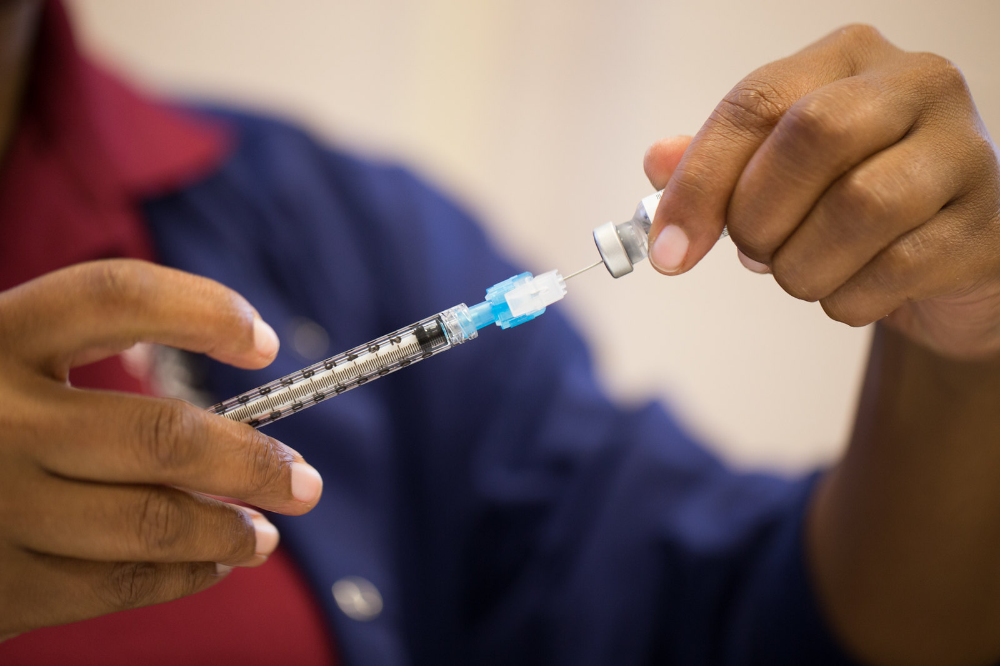

## <span style='color: green;'> Problem Statement </span>
Each year, the recurring flu season compels individuals to weigh the decision of whether to receive the flu vaccine. This decision is influenced with factors such as age groups, genders, and other relevant characteristics. Thus, the goal is to build a predictive model that anticipates people's choices in flu vaccination each year, utilizing historical data to uncover influential patterns. This model serves the primary purpose of aiding public health planning and decision-making. It provides vital insights into vaccination trends, allowing for more efficient resource allocation by the government health agencies. The initiative draws inspiration from past experiences, offering a data-driven approach to address future disease outbreaks and pandemics.

### <span style='color: green;'> Objectives </span>
1. To examine the factors behind individuals' choices to get the annual flu vaccine without stating specific objectives.
2. To come up with strategies for targeting specific population segments to boost vaccination rates.
2. To explore variables like age categories, gender, and household composition to comprehend their statistical significance. 
4. To construct a predictive model for assessing whether people would opt for the Seasonal Flu Vaccine under specific conditions or features.
5. To offer recommendations on increasing vaccination rates

## <span style='color: green;'> Data </span>
The project relies on H1N1_Flu_Vaccines.csv sourced from Kaggle <https://www.kaggle.com/datasets/arashnic/flu-data>, encompassing a comprehensive array of data pertaining to the respondents' socioeconomic and demographic profiles, alongside their perspectives regarding the H1N1 and seasonal flu vaccines. This dataset has 36 column features:
|No.| Column    | Description|
|---| ---       | ---         |
|1| `respondent_id` | Unique and random identifier for the respondents|
|2|`h1n1_concern`| Level of concern about H1N1 flu with 0 being not concerned at all and 3 being very concerned|
|3|`h1n1_knowledge`| Level of knowledge about H1N1 with 0 being no knowledge and 2 being a lot of knowledge|
|4|`behavioral_antiviral_meds`| Has taken any antiviral medication (0-no,1-yes)|
|5|`behavioral_avoidance`| Has avoided close contact with anyone with flu-like symptoms (0-no,1-yes)|
|6|`behavioral_face_mask`| Has bought a face mask (0-no,1-yes)|
|7|`behavioral_wash_hands`| Has frequently washed hands or used hand sanitizer (0-no,1-yes)|
|8|`behavioral_large_gatherings`| Has reduced time at large gatherings (0-no,1-yes)|
|9|`behavioral_outside_home`| Has reduced contact with people outside of own household (0-no,1-yes)|
|10|`behavioral_touch_face`| Has avoided touching eyes, nose or mouth (0-no,1-yes)|
|11|`doctor_recc_h1n1`| H1N1 flu vaccine was recommended by doctor (0-no,1-yes)|
|12|`doctor_recc_seasonal`| H1N1 flu vaccine was recommended by doctor (0-no,1-yes)|
|13|`chronic_med_condition`| Has any of the following chronic conditions: asthma or any lung condition, a heart condition, a kidney condition, sickle cell anaemia or any other anaemia, a neurological or neouromuscular condition, a liver condition, or a weakened immune system as a result of a chronic illness or medicines taken for a chronic illness (0-no,1-yes)|
|14|`child_under_6_months`| Has regular close contact with a child under the age of six months (0-no,1-yes)|
|15|`health_worker`| Is a healthcare worker (0-no,1-yes)|
|16|`health_insurance`| Has health insurance (0-no,1-yes)|
|17|`opinion_h1n1_vacc_effective`| Respondent's opinion on the efficacy of the vaccine with 1 being not at all effective and 5 being very effective|
|18|`opinion_h1n1_risk`| Respondent's opinion about risk of getting sick with H1N1 flu without vaccine with 1 being very low and 5 being very high|
|19|`opinion_h1n1_sick_from_vacc`| Respondent's worry of getting sick from H1N1 vaccine with 1 being not worried at all and 5 being very worried|
|20|`opinion_seas_vacc_effective`| Respondent's opinion about seasonal flu vaccine effectiveness with 1 being not effective at all and 5 being very effective|
|21|`opinion_seas_risk`| Respondent's opinion about risk of getting sick with seasonal flu without vaccine with 1 being very low and 5 being very high|
|22|`opinion_seas_sick_from_vacc`| Respondent's worry of getting sick from taking seasonal flu vaccine with 1 being not worried at all and 5 being very worried|
|23|`age_group`| Age group of respondents|
|24|`education`| Self-reported educational level|
|25|`race`| Race of respondent|
|26|`sex`| Sex of respondent|
|27|`income_poverty`| Household annual income of respondent with respect to 2008 Census poverty thresholds|
|28|`marital status`| Marital status of respondent|
|29|`rent_or_own`| Housing situation of respondent|
|30|`employment_status`| Employment status of respondent|
|31|`hhs_geo_region`| Respondent's residence using a 10-region geographic classification defined by the U.S. Dept. of Health and Human Services. Values are represented as short random character strings|
|32|`census_msa`| Respondent's residence within metropolitan statistical areas (MSA) as defined by the U.S. Census|
|33|`household_adults`| Number of *other* adults in the household, top-coded to 3|
|34|`household_children`| Number of children in the household, top-coded to 3|
|35|`employment_industry`| Type of industry respondent is employed in. Values are represented as short random character strings|
|36|`employment_occupation`| Type of occupation of respondent.Values are represented as short random character strings| 

### <span style= 'color : green'>  Importing Necessary Libraries/Packages </span>


In [1]:
# Importing necessary Libraries and Modules 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn.model_selection import KFold, train_test_split, cross_val_score, learning_curve, GridSearchCV, RandomizedSearchCV
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_selection import chi2, RFECV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_curve, auc, roc_auc_score, ConfusionMatrixDisplay,classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
import joblib

## <span style= 'color : green'>  Data Understanding </span>

In [2]:
# Load the CSV Dataset and assign it to variable df
df = pd.read_csv('H1N1_Flu_Vaccines.csv')
#  View the first 5 rows
df.head()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,...,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN,0,0
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,...,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,...,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN,0,1
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,...,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb,0,0


In [3]:
# Shape of the data
df.shape

(26707, 38)

In [4]:
# Descriptive Statistics
df.describe()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,...,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,h1n1_vaccine,seasonal_vaccine
count,26707.000000,26615.000000,26591.000000,26636.000000,26499.000000,26688.000000,26665.000000,26620.00000,26625.000000,26579.000000,...,26316.000000,26319.000000,26312.000000,26245.000000,26193.000000,26170.000000,26458.000000,26458.000000,26707.000000,26707.000000
mean,13353.000000,1.618486,1.262532,0.048844,0.725612,0.068982,0.825614,0.35864,0.337315,0.677264,...,3.850623,2.342566,2.357670,4.025986,2.719162,2.118112,0.886499,0.534583,0.212454,0.465608
std,7709.791156,0.910311,0.618149,0.215545,0.446214,0.253429,0.379448,0.47961,0.472802,0.467531,...,1.007436,1.285539,1.362766,1.086565,1.385055,1.332950,0.753422,0.928173,0.409052,0.498825
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,6676.500000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000,...,3.000000,1.000000,1.000000,4.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,13353.000000,2.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.00000,0.000000,1.000000,...,4.000000,2.000000,2.000000,4.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000
75%,20029.500000,2.000000,2.000000,0.000000,1.000000,0.000000,1.000000,1.00000,1.000000,1.000000,...,5.000000,4.000000,4.000000,5.000000,4.000000,4.000000,1.000000,1.000000,0.000000,1.000000
max,26706.000000,3.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,3.000000,3.000000,1.000000,1.000000


###### Based on the descriptive statistics shown, all the columns contain categorical data

In [5]:
# Basic information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26707 entries, 0 to 26706
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   respondent_id                26707 non-null  int64  
 1   h1n1_concern                 26615 non-null  float64
 2   h1n1_knowledge               26591 non-null  float64
 3   behavioral_antiviral_meds    26636 non-null  float64
 4   behavioral_avoidance         26499 non-null  float64
 5   behavioral_face_mask         26688 non-null  float64
 6   behavioral_wash_hands        26665 non-null  float64
 7   behavioral_large_gatherings  26620 non-null  float64
 8   behavioral_outside_home      26625 non-null  float64
 9   behavioral_touch_face        26579 non-null  float64
 10  doctor_recc_h1n1             24547 non-null  float64
 11  doctor_recc_seasonal         24547 non-null  float64
 12  chronic_med_condition        25736 non-null  float64
 13  child_under_6_mo

###### A good number of columns have missing values. Some columns contain string data types that need encoding. 

In [6]:
# View total missing values on each column
missing_values = df.isna().sum().sort_values(ascending = False)
print(missing_values)

employment_occupation          13470
employment_industry            13330
health_insurance               12274
income_poverty                  4423
doctor_recc_h1n1                2160
doctor_recc_seasonal            2160
rent_or_own                     2042
employment_status               1463
marital_status                  1408
education                       1407
chronic_med_condition            971
child_under_6_months             820
health_worker                    804
opinion_seas_sick_from_vacc      537
opinion_seas_risk                514
opinion_seas_vacc_effective      462
opinion_h1n1_sick_from_vacc      395
opinion_h1n1_vacc_effective      391
opinion_h1n1_risk                388
household_adults                 249
household_children               249
behavioral_avoidance             208
behavioral_touch_face            128
h1n1_knowledge                   116
h1n1_concern                      92
behavioral_large_gatherings       87
behavioral_outside_home           82
b

**employment_occupation**, **employment_industry** and **health_insurance** columns contain a lot of missing data, each close to half of the entire dataset. Let's look at them

In [7]:
# View the values of these columns
print(df['employment_occupation'].value_counts())
print('---------------------------------------')
print(df['employment_industry'].value_counts())
print('---------------------------------------')
print(df['health_insurance'].value_counts())

employment_occupation
xtkaffoo    1778
mxkfnird    1509
emcorrxb    1270
cmhcxjea    1247
xgwztkwe    1082
hfxkjkmi     766
qxajmpny     548
xqwwgdyp     485
kldqjyjy     469
uqqtjvyb     452
tfqavkke     388
ukymxvdu     372
vlluhbov     354
oijqvulv     344
ccgxvspp     341
bxpfxfdn     331
haliazsg     296
rcertsgn     276
xzmlyyjv     248
dlvbwzss     227
hodpvpew     208
dcjcmpih     148
pvmttkik      98
Name: count, dtype: int64
---------------------------------------
employment_industry
fcxhlnwr    2468
wxleyezf    1804
ldnlellj    1231
pxcmvdjn    1037
atmlpfrs     926
arjwrbjb     871
xicduogh     851
mfikgejo     614
vjjrobsf     527
rucpziij     523
xqicxuve     511
saaquncn     338
cfqqtusy     325
nduyfdeo     286
mcubkhph     275
wlfvacwt     215
dotnnunm     201
haxffmxo     148
msuufmds     124
phxvnwax      89
qnlwzans      13
Name: count, dtype: int64
---------------------------------------
health_insurance
1.0    12697
0.0     1736
Name: count, dtype: int64


In [8]:
# View all the columns of the df
pd.set_option('display.max_columns', 50)

# viewing first five rows

df.head()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN,0,0
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN,0,1
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb,0,0


###### There are two target variables:

1. h1n1_vaccine - Whether respondent received H1N1 flu vaccine.
2. seasonal_vaccine - Whether respondent received seasonal flu vaccine.

Both are binary variables: 0 = No; 1 = Yes.

<style>
  table {
    width: 100%;
    background-color: #333;
    color: white;
  }

  th {
    background-color: #444;
  }

###### There two target/label variables:
1. h1n1_vaccine - Whether respondent received H1N1 flu vaccine.
2. seasonal_vaccine - Whether respondent received seasonal flu vaccine.

Both are binary variables: 0 = No; 1 = Yes.

The rest are feature columns and are described in the above Data section of this notebook

In [9]:
# Number of patients who received both vaccines
patients_received_both = len(df[(df['h1n1_vaccine'] == 1) & (df['seasonal_vaccine'] == 1)])

# Number of patients who did not receive either vaccine
patients_did_not_receive_either = len(df[(df['h1n1_vaccine'] == 0) & (df['seasonal_vaccine'] == 0)])

# Number of patients who received only one vaccine
patients_received_only_one = len(df[((df['h1n1_vaccine'] == 1) ^ (df['seasonal_vaccine'] == 1))])

print("Number of patients who received both vaccines:", patients_received_both)
print("Number of patients who did not receive either vaccine:", patients_did_not_receive_either)
print("Number of patients who received only one vaccine:", patients_received_only_one)                                    

Number of patients who received both vaccines: 4697
Number of patients who did not receive either vaccine: 13295
Number of patients who received only one vaccine: 8715


Some respondents didn't get either vaccine, others got only one, and some got both.

In [10]:
# Check Duplicates in the data
print ('duplicated :' , df.duplicated().sum())

duplicated : 0


No duplicates in the dataset

## <span style= 'color : green'>  Data Preparation/ Cleaning </span>

#### <span style= 'color: purple'>  Handling Missing Values </span>

**simple imputer** will be used in handling the missing data. The method will consider the randomness and distribution of the values of columns with the missing data. 

The data is divided into two categories: categorical and numerical features. These two categories are handled differently during when imputing the missing data. 

For numerical columns, the <span style="background-color: lightblue">*most frequent value* </span> is employed as the imputation strategy. This choice is made to ensure the preservation of the overall distribution of categorical data. 

As for categorical columns, the <span style="background-color: lightblue">*most frequent value* </span> strategy is also applied, given that a significant portion of the values consist of repetitive classes.

In [11]:
# Handling null values

numerical_data = df.select_dtypes(exclude= 'object')

# Instantiate imputer

imputer_1 = SimpleImputer(missing_values= np.nan, strategy= 'most_frequent')

# Fit and transform our numerical values

numerical_data.iloc[:,:] = imputer_1.fit_transform(numerical_data)

# Assign the imputed values back to the original DataFrame
df[numerical_data.columns] = numerical_data

In [12]:
# Instantiate imputer

imputer_2 = SimpleImputer(missing_values= np.nan, strategy= 'most_frequent')

categorical_data =df.select_dtypes(include= 'object')

# Fit and transform our categorical values

categorical_data.iloc[:,:] = imputer_2.fit_transform(categorical_data)
# Assign the imputed values back to the original DataFrame
df[categorical_data.columns] = categorical_data
# Make copy of imputed categorical_data for EDA visualizations
categorical_data_copy = categorical_data.copy()

Confirming that no column with missing value

In [13]:
# View total missing values on each column
missing_values = df.isna().sum().sort_values(ascending = False)
print(missing_values)

respondent_id                  0
rent_or_own                    0
opinion_seas_sick_from_vacc    0
age_group                      0
education                      0
race                           0
sex                            0
income_poverty                 0
marital_status                 0
employment_status              0
h1n1_concern                   0
hhs_geo_region                 0
census_msa                     0
household_adults               0
household_children             0
employment_industry            0
employment_occupation          0
h1n1_vaccine                   0
opinion_seas_risk              0
opinion_seas_vacc_effective    0
opinion_h1n1_sick_from_vacc    0
opinion_h1n1_risk              0
h1n1_knowledge                 0
behavioral_antiviral_meds      0
behavioral_avoidance           0
behavioral_face_mask           0
behavioral_wash_hands          0
behavioral_large_gatherings    0
behavioral_outside_home        0
behavioral_touch_face          0
doctor_rec

##### All missing values have been handled

Next:
#### <span style= 'color: purple'>  Data Encoding </span>
Object categorical column data needs to be encoded to numerical values for machine learning modelling.
***LabelEncoder*** is most suitable for this situation because there is no specific order (no hierarchical relationship) on these object columns.

In [14]:
# Create a LabelEncoder instance
label_encoder = LabelEncoder()

# Iterate over the categorical columns in the DataFrame
categorical_columns = categorical_data.select_dtypes(include=['object']).columns

for column in categorical_columns:
    categorical_data[column] = label_encoder.fit_transform(categorical_data[column])
# Assign the encoded values back to the original DataFrame
df[categorical_data.columns] = categorical_data

In [15]:
# Confirm that the columns have been encode
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26707 entries, 0 to 26706
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   respondent_id                26707 non-null  int64  
 1   h1n1_concern                 26707 non-null  float64
 2   h1n1_knowledge               26707 non-null  float64
 3   behavioral_antiviral_meds    26707 non-null  float64
 4   behavioral_avoidance         26707 non-null  float64
 5   behavioral_face_mask         26707 non-null  float64
 6   behavioral_wash_hands        26707 non-null  float64
 7   behavioral_large_gatherings  26707 non-null  float64
 8   behavioral_outside_home      26707 non-null  float64
 9   behavioral_touch_face        26707 non-null  float64
 10  doctor_recc_h1n1             26707 non-null  float64
 11  doctor_recc_seasonal         26707 non-null  float64
 12  chronic_med_condition        26707 non-null  float64
 13  child_under_6_mo

###### All the columns now contain numerical values

Drop the <span style="background-color: lightblue">*respondent_id* </span> column since it was only used to uniquely identify the respondents. 

In [16]:
# Drop the column "A" from the DataFrame "df"
df.drop("respondent_id", axis=1, inplace=True)

## <span style= 'color : green'>  Exploratory Data Analysis (EDA) </span>

### <span style= 'color: purple'>  Univariate Analysis </span>

#### <span style= 'color: purple'>  *1. Distribution of Target Variables* </span>
What is the distribution of those who received the vaccines and those did not? Let's see.

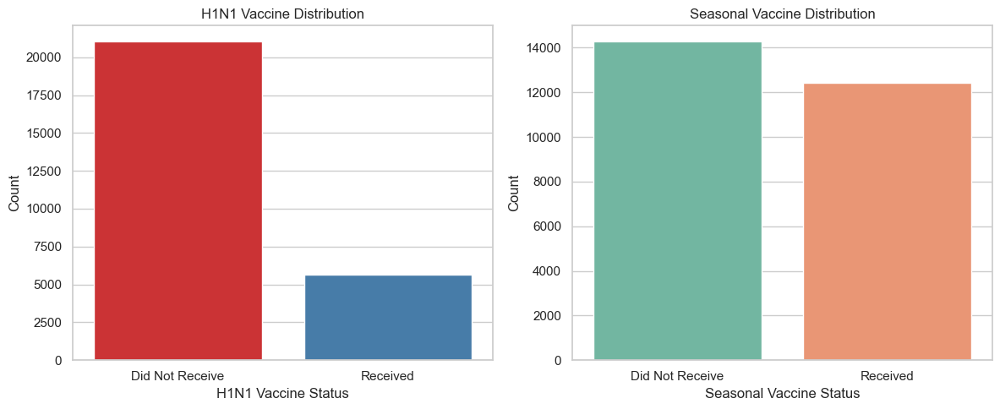

In [17]:
# Set the style for the plots
sns.set(style="whitegrid")

# Create subplots for both columns
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot for H1N1 vaccine
sns.countplot(data=df, x="h1n1_vaccine", palette="Set1", ax=axes[0])
axes[0].set_title("H1N1 Vaccine Distribution")
axes[0].set_xticklabels(["Did Not Receive", "Received"])
axes[0].set_xlabel("H1N1 Vaccine Status")
axes[0].set_ylabel("Count")

# Plot for Seasonal vaccine
sns.countplot(data=df, x="seasonal_vaccine", palette="Set2", ax=axes[1])
axes[1].set_title("Seasonal Vaccine Distribution")
axes[1].set_xticklabels(["Did Not Receive", "Received"])
axes[1].set_xlabel("Seasonal Vaccine Status")
axes[1].set_ylabel("Count")

# Adjust spacing between subplots
plt.tight_layout()
# Save the plot as an image file
plt.savefig('Distribution_of_Target_Variables.png', bbox_inches='tight')
# Show the plots
plt.show()


*H1N1 Vaccine Distribution visualization shows class imbalance between those that received and did not receive the vaccine. 
Interestingly, there is no huge class imbalance seen in the seasonal vaccine.* 

In [18]:
# Frequency Table for h1n1_vaccine
h1n1_vaccine_freq = df['h1n1_vaccine'].value_counts()

# Frequency Table for seasonal_vaccine
seasonal_vaccine_freq = df['seasonal_vaccine'].value_counts()

print("Frequency Table for h1n1_vaccine:")
print(h1n1_vaccine_freq)
print("\nFrequency Table for seasonal_vaccine:")
print(seasonal_vaccine_freq)

Frequency Table for h1n1_vaccine:
h1n1_vaccine
0    21033
1     5674
Name: count, dtype: int64

Frequency Table for seasonal_vaccine:
seasonal_vaccine
0    14272
1    12435
Name: count, dtype: int64


It is now important to know the level of concern and knowledge about the H1N1 Vaccine amongst the respondents to understand better the class imbalance observed. 

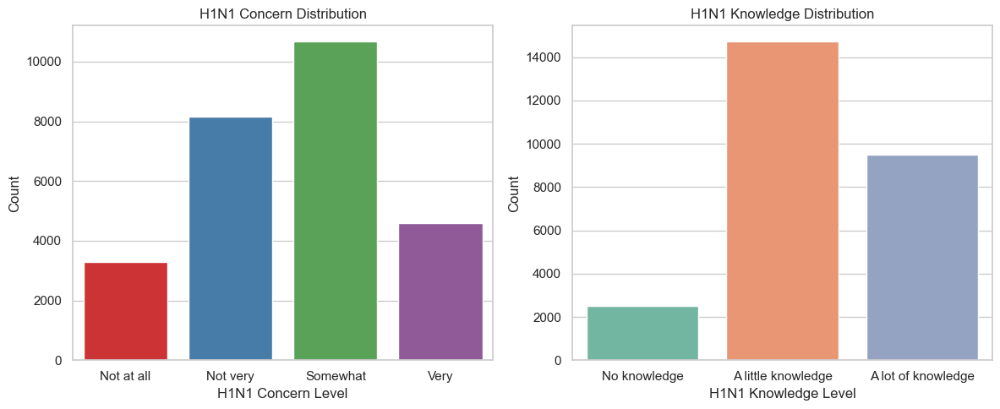

In [19]:
# Set the style for the plots
sns.set(style="whitegrid")

# Create subplots for both columns
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot for H1N1 concern
sns.countplot(data=df, x="h1n1_concern", palette="Set1", ax=axes[0])
axes[0].set_title("H1N1 Concern Distribution")
axes[0].set_xticklabels(["Not at all", "Not very", "Somewhat", "Very"])
axes[0].set_xlabel("H1N1 Concern Level")
axes[0].set_ylabel("Count")

# Plot for H1N1 knowledge
sns.countplot(data=df, x="h1n1_knowledge", palette="Set2", ax=axes[1])
axes[1].set_title("H1N1 Knowledge Distribution")
axes[1].set_xticklabels(["No knowledge", "A little knowledge", "A lot of knowledge"])
axes[1].set_xlabel("H1N1 Knowledge Level")
axes[1].set_ylabel("Count")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

In [20]:
# Frequency Table for h1n1_vaccine
H1N1_knowledge_level_freq = df["h1n1_knowledge"].value_counts()

# Frequency Table for seasonal_vaccine
H1N1_concern_level_freq = df['h1n1_concern'].value_counts()

print("Frequency Table for h1n1_vaccine concern level:")
print(H1N1_knowledge_level_freq)
print("\nFrequency Table for h1n1_vaccine knowledge level:")
print(H1N1_concern_level_freq)

Frequency Table for h1n1_vaccine concern level:
h1n1_knowledge
1.0    14714
2.0     9487
0.0     2506
Name: count, dtype: int64

Frequency Table for h1n1_vaccine knowledge level:
h1n1_concern
2.0    10667
1.0     8153
3.0     4591
0.0     3296
Name: count, dtype: int64


Based on the plots and frequency tables, there is substantial portion of respondents that have some knowledge and concern, though it varies across levels. In terms of concern, most respondents are "Somewhat concerned," and in terms of knowledge, the majority have "A little knowledge." There's an imbalance in knowledge and concern levels.

#### <span style= 'color: purple'>  *2. Distribution of some Feature Variables* </span>

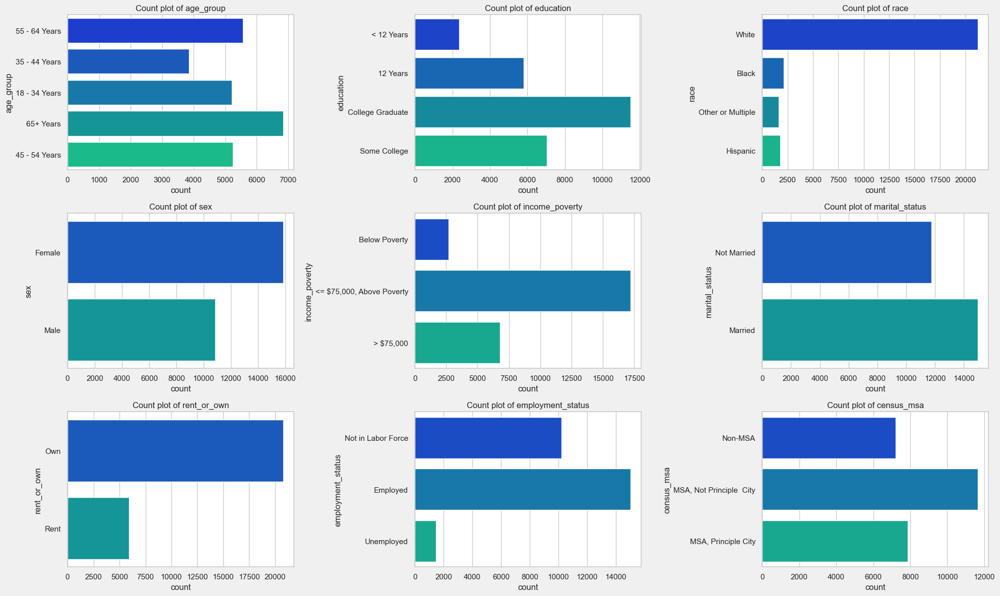

In [21]:
# Drop columns that will not be used for this visualization because of their column values.

categorical_data_copy = categorical_data_copy.drop(['employment_industry', 'employment_occupation', 'hhs_geo_region'], axis=1)

#Get columns for plot

count_plot = categorical_data_copy.columns

# Setting the  size and axes of my visualization

fig, axes = plt.subplots(nrows=3 , ncols=3, figsize=(20, 12))

fig.patch.set_facecolor('#F0F0F0') 

# Iterate over the columns and corresponding axes
for column, ax in zip(count_plot, axes.flatten()):
    sns.countplot(data=categorical_data_copy, y=column, ax=ax, linewidth = 1, palette="winter")
    ax.set_title(f'Count plot of {column}')

# plotting the graph
plt.tight_layout()
plt.savefig('Distribution_of_some_Feature Variables.png', bbox_inches='tight')
plt.show()

From the visualizations, 
1. Age Group: Our dataset is comprehensive for all age groups above 18 years, ensuring a robust representation.

2. Education: College graduates significantly dominate the dataset, accounting for a substantial portion of the records.

3. Race: The dataset exhibits a notable bias toward the white racial category, while other racial groups are underrepresented.

4. Sex: While there are more females than males in our dataset, the gender distribution remains relatively balanced, with males not significantly underrepresented.

5. Income Poverty: The majority of the population in our dataset falls within the income range between the poverty line and $75,000.

6. Marital Status: Both unmarried and married individuals are well-represented in the dataset, providing a diverse marital status profile.

7. Rent or Own: Homeowners make up the majority of the population, revealing an imbalance in this aspect of housing arrangements.

8. Employment Status: The dataset predominantly comprises individuals who are either employed or not in the labor force, offering a comprehensive overview of employment situations.

9. Residence: Majority of the respondents are not from the metropolitan statistical areas (MSA)' principal city. However, substantial number of them are from the MSA's principal city and others are Non-MSAs.







### <span style= 'color: purple'>  Bivariate/Multivariate Analysis </span>

###### What are the opinions of the respondents about H1N1 and Seasonal Vaccines?

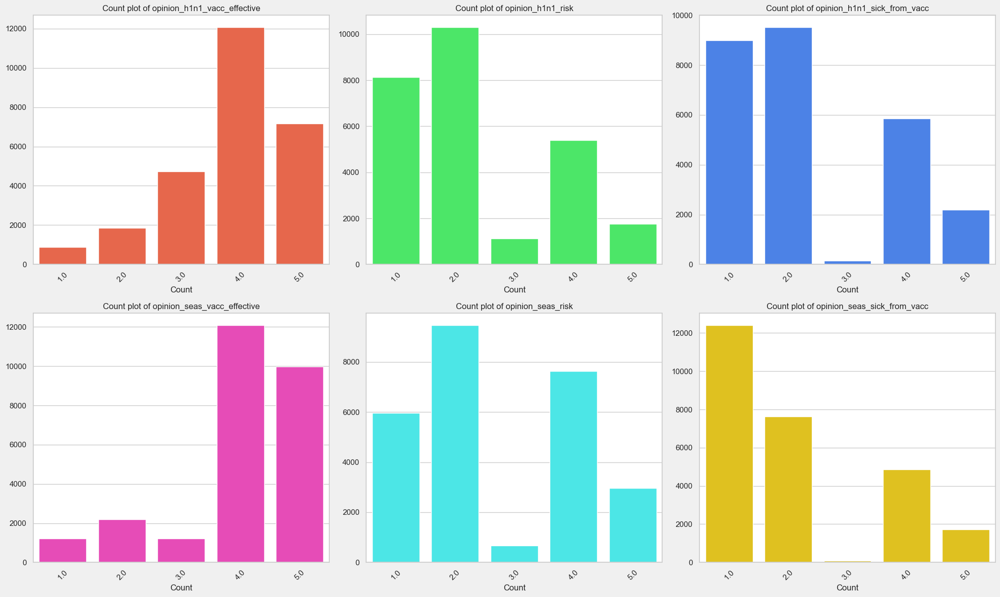

In [22]:
# Opinion columns
opinion_columns = df[[
    "opinion_h1n1_vacc_effective",
    "opinion_h1n1_risk",
    "opinion_h1n1_sick_from_vacc",
    "opinion_seas_vacc_effective",
    "opinion_seas_risk",
    "opinion_seas_sick_from_vacc"
]]

# Get columns for plotting
counts = opinion_columns.columns

# Setting the size and axes of the visualization
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20, 12))
fig.patch.set_facecolor('#F0F0F0')

# Define custom colors for the count plots
colors = ["#FF5733", "#33FF57", "#337AFF", "#FF33C1", "#33FFFF", "#FFD700"]

# Iterate over the columns and corresponding axes
for column, ax, color in zip(counts, axes.flatten(), colors):
    sns.countplot(data=opinion_columns, x=column, ax=ax, linewidth=1, palette=[color])
    ax.set_title(f'Count plot of {column}')
    ax.set_xlabel("Count")
    ax.set_ylabel("")

# Rotate x-axis labels for better readability
for ax in axes.flat:
    plt.setp(ax.get_xticklabels(), rotation=45)

# Plot the graph
plt.tight_layout()
plt.savefig('opinions_of_the_respondents_about_H1N1_and_Seasonal_Vaccines.png', bbox_inches='tight')
plt.show();

<span style="background-color: blue">1 = Not at all worried; 2 = Not very worried; 3 = Don't know; 4 = Somewhat worried; 5 = Very worried. </span>

The data suggests that respondents generally consider both H1N1 and seasonal vaccines to be moderately effective, with few believing them to be ineffective. Concerns about vaccination risks are low, with more moderate apprehension for the seasonal vaccine compared to H1N1. Interestingly, many respondents show little fear of getting sick after either vaccine. Overall, vaccine perceptions are positive, and worries about risks and sickness are limited. 





In [23]:
# Create subplots with titles
fig = make_subplots(rows=3, cols=3, subplot_titles=(
    'Sex', 'Age Group', 'Education', 'Marital Status', 'Race', 'Health Worker', 'Health Insurance', 'Doctor Recommendation', 'Chronic Medical Condition'))

# Define features and titles 
features = ['sex', 'age_group', 'education', 'marital_status', 'race', 'health_worker', 'health_insurance', 'doctor_recc_seasonal', 'chronic_med_condition']
titles = ['Sex', 'Age Group', 'Education', 'Marital Status', 'Race', 'Health Worker', 'Health Insurance', 'Doctor Recommendation', 'Chronic Medical Condition']

# Loop through the features and add violin plots to the subplots
for i, var in enumerate(features):
    row = (i // 3) + 1
    col = (i % 3) + 1
    fig.add_trace(go.Violin(x=df[var], y=df['seasonal_vaccine'], name=titles[i]), row=row, col=col)

# Update the layout with various colors
colors = ['purple', 'blue', 'green', 'orange', 'red', 'cyan', 'magenta', 'yellow', 'black']
for i, trace in enumerate(fig.data):
    trace.fillcolor = colors[i]

fig.update_layout(height=1100, width=1100, title_text="Violin Subplots", template="simple_white")

# Show the figure
plt.savefig('violin.png', bbox_inches='tight')
fig.show();

<Figure size 640x480 with 0 Axes>

1. Doctor's Recommendation for Seasonal Vaccine: A notable difference exists in the uptake of the seasonal vaccine concerning whether individuals received a recommendation for the H1N1 vaccine. Individuals who did not receive a recommendation for the H1N1 vaccine (coded as 0) showed a lower propensity to take the seasonal vaccine compared to those who received a recommendation (coded as 1). This observation suggests an association between recommendations for these two vaccines.

2. Health Insurance Status: A significant difference is observed between individuals with and without health insurance concerning their decision to take the seasonal vaccine. Those without health insurance displayed a lower likelihood of taking the vaccine, whereas individuals with insurance exhibited a more balanced distribution in their vaccine uptake.

3. Occupation as Health Worker: There is a marked contrast in the vaccination patterns between individuals employed as health workers and those in other occupations. A larger proportion of health workers opted to take the seasonal vaccine, while a substantial majority of non-health workers chose not to receive it.

4. Marital Status: Among individuals who are not married, a substantial portion opted for vaccination, and the distribution was relatively even. In contrast, the married population displayed a more uniform distribution with respect to vaccine uptake.

5. Chronic Medical Conditions: The presence of chronic medical conditions significantly influenced the seasonal vaccine intake. Individuals with chronic medical conditions exhibited a higher vaccination rate, while those without such conditions displayed a lower likelihood of vaccine uptake.

###### Due to huge class imbalance in <span style="background-color: lightblue">'h1n1_vaccine' </span>, I select <span style="background-color: lightblue">'seasonal_vaccine'</span> to be my target variable for the purpose of this project. However, more feature engineering can be done on <span style="background-color: lightblue">'h1n1_vaccine' </span> to handle the imbalance.

Thus, at this point I drop <span style="background-color: lightblue">'h1n1_vaccine' </span>.

In [24]:
# Drop h1n1_vaccine column
df = df.drop('h1n1_vaccine', axis=1)
df.head(2) # Viewing to confirm the column is dropped

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,seasonal_vaccine
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,3,1,3,0,2,1,0,1,8,2,0.0,0.0,4,21,0
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,1,0,3,1,2,1,1,0,1,0,0.0,0.0,12,19,1


### <span style= 'color: purple'>  Data Pre-Processing </span>
#### <span style= 'color: purple'>  1.Separating target variable (seasonal_vaccine) from the predicting features </span>

In [25]:
#  Defining target variabe(y) and predicting variables(X)
y = df["seasonal_vaccine"]
X = df.drop('seasonal_vaccine', axis = 1)

#### <span style= 'color: purple'>  2. Selection of Features </span>

##### a.  Cross-Tabulation.
Checking the association of the indpendent features with the target variable

In [26]:
# Set Pandas display options to show all columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Create cross-tabulations for each predicting variable
for column in X.columns:
    cross_tab = pd.crosstab(X[column], y)
    print(f"Cross-Tabulation for {column}:\n")
    display(cross_tab)
    print("\n")

Cross-Tabulation for h1n1_concern:



seasonal_vaccine,0,1
h1n1_concern,,
0.0,2254,1042
1.0,4811,3342
2.0,5185,5482
3.0,2022,2569




Cross-Tabulation for h1n1_knowledge:



seasonal_vaccine,0,1
h1n1_knowledge,,
0.0,1588,918
1.0,8350,6364
2.0,4334,5153




Cross-Tabulation for behavioral_antiviral_meds:



seasonal_vaccine,0,1
behavioral_antiviral_meds,,
0.0,13594,11812
1.0,678,623




Cross-Tabulation for behavioral_avoidance:



seasonal_vaccine,0,1
behavioral_avoidance,,
0.0,4337,2934
1.0,9935,9501




Cross-Tabulation for behavioral_face_mask:



seasonal_vaccine,0,1
behavioral_face_mask,,
0.0,13457,11409
1.0,815,1026




Cross-Tabulation for behavioral_wash_hands:



seasonal_vaccine,0,1
behavioral_wash_hands,,
0.0,3052,1598
1.0,11220,10837




Cross-Tabulation for behavioral_large_gatherings:



seasonal_vaccine,0,1
behavioral_large_gatherings,,
0.0,9577,7583
1.0,4695,4852




Cross-Tabulation for behavioral_outside_home:



seasonal_vaccine,0,1
behavioral_outside_home,,
0.0,9808,7918
1.0,4464,4517




Cross-Tabulation for behavioral_touch_face:



seasonal_vaccine,0,1
behavioral_touch_face,,
0.0,5330,3248
1.0,8942,9187




Cross-Tabulation for doctor_recc_h1n1:



seasonal_vaccine,0,1
doctor_recc_h1n1,,
0.0,12445,8854
1.0,1827,3581




Cross-Tabulation for doctor_recc_seasonal:



seasonal_vaccine,0,1
doctor_recc_seasonal,,
0.0,12155,6458
1.0,2117,5977




Cross-Tabulation for chronic_med_condition:



seasonal_vaccine,0,1
chronic_med_condition,,
0.0,11382,8035
1.0,2890,4400




Cross-Tabulation for child_under_6_months:



seasonal_vaccine,0,1
child_under_6_months,,
0.0,13178,11391
1.0,1094,1044




Cross-Tabulation for health_worker:



seasonal_vaccine,0,1
health_worker,,
0.0,13249,10559
1.0,1023,1876




Cross-Tabulation for health_insurance:



seasonal_vaccine,0,1
health_insurance,,
0.0,1338,398
1.0,12934,12037




Cross-Tabulation for opinion_h1n1_vacc_effective:



seasonal_vaccine,0,1
opinion_h1n1_vacc_effective,,
1.0,699,187
2.0,1381,477
3.0,2727,1996
4.0,6687,5387
5.0,2778,4388




Cross-Tabulation for opinion_h1n1_risk:



seasonal_vaccine,0,1
opinion_h1n1_risk,,
1.0,5407,2732
2.0,5643,4664
3.0,540,577
4.0,2029,3365
5.0,653,1097




Cross-Tabulation for opinion_h1n1_sick_from_vacc:



seasonal_vaccine,0,1
opinion_h1n1_sick_from_vacc,,
1.0,4986,4012
2.0,5087,4437
3.0,86,62
4.0,2914,2936
5.0,1199,988




Cross-Tabulation for opinion_seas_vacc_effective:



seasonal_vaccine,0,1
opinion_seas_vacc_effective,,
1.0,1028,193
2.0,1885,321
3.0,876,340
4.0,7538,4553
5.0,2945,7028




Cross-Tabulation for opinion_seas_risk:



seasonal_vaccine,0,1
opinion_seas_risk,,
1.0,4723,1251
2.0,5926,3542
3.0,300,377
4.0,2568,5062
5.0,755,2203




Cross-Tabulation for opinion_seas_sick_from_vacc:



seasonal_vaccine,0,1
opinion_seas_sick_from_vacc,,
1.0,6123,6284
2.0,4391,3242
3.0,77,17
4.0,2622,2230
5.0,1059,662




Cross-Tabulation for age_group:



seasonal_vaccine,0,1
age_group,,
0,3731,1484
1,2453,1395
2,3136,2102
3,2719,2844
4,2233,4610




Cross-Tabulation for education:



seasonal_vaccine,0,1
education,,
0,3199,2598
1,1415,948
2,5798,5706
3,3860,3183




Cross-Tabulation for race:



seasonal_vaccine,0,1
race,,
0,1377,741
1,1159,596
2,935,677
3,10801,10421




Cross-Tabulation for sex:



seasonal_vaccine,0,1
sex,,
0,7970,7888
1,6302,4547




Cross-Tabulation for income_poverty:



seasonal_vaccine,0,1
income_poverty,,
0,9126,8074
1,3427,3383
2,1719,978




Cross-Tabulation for marital_status:



seasonal_vaccine,0,1
marital_status,,
0,7716,7247
1,6556,5188




Cross-Tabulation for rent_or_own:



seasonal_vaccine,0,1
rent_or_own,,
0,10540,10238
1,3732,2197




Cross-Tabulation for employment_status:



seasonal_vaccine,0,1
employment_status,,
0,8735,6288
1,4523,5708
2,1014,439




Cross-Tabulation for hhs_geo_region:



seasonal_vaccine,0,1
hhs_geo_region,,
0,1031,1002
1,1433,1413
2,637,489
3,1717,1548
4,1482,1376
5,1219,859
6,2349,1948
7,1235,1008
8,1520,1339




Cross-Tabulation for census_msa:



seasonal_vaccine,0,1
census_msa,,
0,6076,5569
1,4296,3568
2,3900,3298




Cross-Tabulation for household_adults:



seasonal_vaccine,0,1
household_adults,,
0.0,4079,3977
1.0,7785,6938
2.0,1691,1112
3.0,717,408




Cross-Tabulation for household_children:



seasonal_vaccine,0,1
household_children,,
0.0,9402,9519
1.0,1953,1222
2.0,1769,1095
3.0,1148,599




Cross-Tabulation for employment_industry:



seasonal_vaccine,0,1
employment_industry,,
0,470,401
1,579,347
2,207,118
3,130,71
4,7450,8348
5,23,125
6,762,469
7,192,83
8,346,268




Cross-Tabulation for employment_occupation:



seasonal_vaccine,0,1
employment_occupation,,
0,181,150
1,221,120
2,389,858
3,23,125
4,131,96
5,690,580
6,120,176
7,438,328
8,114,94


###### Cross-tabulation indicates strong association between some features and the target variable while other features indicate relatively low relationship. 
Additional analysis is required on these features to refine the feature selection process.

#### b. Chi- Square


In [27]:
# Calculate chi-square statistics and p-values
chi2_stat, p_values = chi2(X, y)

# Create a DataFrame to display the results
chi2_results = pd.DataFrame({'Variable': X.columns, 'Chi2': chi2_stat, 'P-Value': p_values})

# Sort the results by p-value (lower p-value suggests more significant relationship)
chi2_results = chi2_results.sort_values(by='P-Value')

# You can set a significance level (alpha) to filter significant features
alpha = 0.05
significant_features = chi2_results[chi2_results['P-Value'] < alpha]

# Print or inspect the significant features
print("Significant Features:")
print(significant_features)

Significant Features:
                       Variable         Chi2        P-Value
21                    age_group  1997.217625   0.000000e+00
19            opinion_seas_risk  2794.888237   0.000000e+00
33          employment_industry  1669.849661   0.000000e+00
10         doctor_recc_seasonal  2421.579654   0.000000e+00
18  opinion_seas_vacc_effective   991.273021  1.416462e-217
16            opinion_h1n1_risk   866.169464  2.219880e-190
9              doctor_recc_h1n1   839.733852  1.240122e-184
11        chronic_med_condition   557.625394  2.761707e-123
32           household_children   538.442999  4.112971e-119
13                health_worker   383.862558   1.794869e-85
0                  h1n1_concern   325.148276   1.095274e-72
15  opinion_h1n1_vacc_effective   286.280388   3.213986e-64
27                  rent_or_own   215.311327   9.531292e-49
8         behavioral_touch_face   123.369866   1.157332e-28
1                h1n1_knowledge   115.652237   5.663978e-27
24                

In [28]:
# How many of signficant features according to Chi Square scores?
print(len(significant_features))

34


Among the 36 features considered, 34 have been found to be statistically significant according to a chi-square test. It is important to note that not all of these significant features exhibit the same level of statistical significance. Features with a chi-square test statistic exceeding a threshold of 100 are selected for further analysis, as they demonstrate a notably high level of statistical importance.

In [29]:
# Display the top 15 features based on chi-square value of more than 100
top_15_features = significant_features.head(15)

# Display the features in a DataFrame format as they appear in the original dataset.
selected_feature_names = top_15_features['Variable']
selected_features = X[selected_feature_names]
selected_features.head()

,age_group,opinion_seas_risk,employment_industry,doctor_recc_seasonal,opinion_seas_vacc_effective,opinion_h1n1_risk,doctor_recc_h1n1,chronic_med_condition,household_children,health_worker,h1n1_concern,opinion_h1n1_vacc_effective,rent_or_own,behavioral_touch_face,h1n1_knowledge
0,3,1.0,4,0.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0,1.0,0.0
1,1,2.0,12,0.0,4.0,4.0,0.0,0.0,0.0,0.0,3.0,5.0,1,1.0,2.0
2,0,1.0,14,0.0,4.0,1.0,0.0,1.0,0.0,0.0,1.0,3.0,0,0.0,1.0
3,4,4.0,4,1.0,5.0,3.0,0.0,1.0,0.0,0.0,1.0,3.0,1,0.0,1.0
4,2,1.0,18,0.0,3.0,3.0,0.0,0.0,0.0,0.0,2.0,3.0,0,1.0,1.0


Significant features have been obtained. The next step is modelling.

## <span style= 'color : green'>  Modelling </span>
Re-define our variables as X and y and split them into training and testing sets

In [30]:
# Re-defining variables
X = selected_features
y = y

#  Splitting dataset into training and testing sets with a random_state = 42  and test_size = 0.20
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, stratify=y, random_state=42)

***Defining Evaluation Metrics that will be used to test models***

The model evaluation metrics will involve scores and visualizations.

In [31]:
# Define the fucntion of evaluation metrics
def evaluate_model(model):

    # Fit the model on the training data
    model.fit(X_train, y_train)

    # Predict on the test set
    y_test_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)

    # Calculate accuracy scores
    accuracy_train = accuracy_score(y_train, y_train_pred)
    accuracy_test = accuracy_score(y_test, y_test_pred)

    # Perform cross-validation
    cross_val = cross_val_score(model, X_train, y_train, cv=cv)

    # Confusion Matrix
    cmatrix = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(8, 6))
    ax = sns.heatmap(cmatrix, annot=True, fmt='d', cmap='coolwarm')
    ax.set_xlabel('Predicted')
    ax.set_ylabel('True')

    # Print evaluation results
    print(f'Model Train accuracy: {accuracy_train:.3f}')
    print(f'Model Test accuracy: {accuracy_test:.3f}')
    print(f"Cross Validation Accuracy: {round(cross_val.mean() * 100, 4)}%")

    print('\n--------------------------------------------\n')

    # Print classification report
    print(classification_report(y_test, y_test_pred))


In [32]:
# Define Learning Curve function for visualization
def plot_learning_curve(model):

    # Generate the learning curve using the learning_curve function
    train_sizes, train_scores, test_scores = learning_curve(
        model, X_train, y_train, scoring='accuracy')

    # Calculate the mean and standard deviation of the training scores
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)

    # Calculate the mean and standard deviation of the validation scores
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)

    # Plot the training scores and fill the area between the upper and lower bounds
    plt.figure(figsize=(10, 8))
    plt.plot(train_sizes, train_mean, 'o-', color='red', label='Training Score')
    plt.fill_between(
        train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='red')

    # Plot the validation scores and fill the area between the upper and lower bounds
    plt.plot(train_sizes, test_mean, 'o-', color='green', label='Validation Score')
    plt.fill_between(
        train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='green')

    # Set the x-axis label
    plt.xlabel('Training Examples')

    # Set the y-axis label
    plt.ylabel('Score')

    # Add a legend to the plot
    plt.legend(loc='best')

    # Add a grid to the plot
    plt.grid(True)
    plt.show()


In [33]:
# Define roc_curve, auc function for visualization
def plot_roc_auc(model):
    # Get the predicted probabilities for the positive class
    y_prob = model.predict_proba(X_test)[:, 1]

    # Calculate the ROC curve and AUC
    fpr, tpr, thresholds = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)

    # Plot the ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc='lower right')
    plt.show()


### <span style= 'color: purple'>  Base Model </span>

### <span style= 'color: orange'>  Decision Tree Classifier Model </span>

In [34]:
# Instantiate the StandardScaler
scaler = StandardScaler()

# Fit and transform the training data
X_train_scaled = scaler.fit_transform(X_train)

# Create the DecisionTreeClassifier
tree_1 = DecisionTreeClassifier()

# Define the parameter grid (without hyperparameters)
param_grid = {'criterion': ['entropy']}  # Without max_depth, min_samples_split, and min_samples_leaf

# Create the GridSearchCV
cv = 10
base_decision_tree = GridSearchCV(estimator=tree_1, 
                                  param_grid=param_grid,
                                  scoring='accuracy',
                                  cv=cv)

# Fit the model to the scaled training data
Decision_tree_base_model_1 = base_decision_tree.fit(X_train_scaled, y_train)


Model Train accuracy: 0.970
Model Test accuracy: 0.696
Cross Validation Accuracy: 68.6122%

--------------------------------------------

              precision    recall  f1-score   support

           0       0.71      0.74      0.72      2855
           1       0.68      0.65      0.67      2487

    accuracy                           0.70      5342
   macro avg       0.69      0.69      0.69      5342
weighted avg       0.70      0.70      0.70      5342



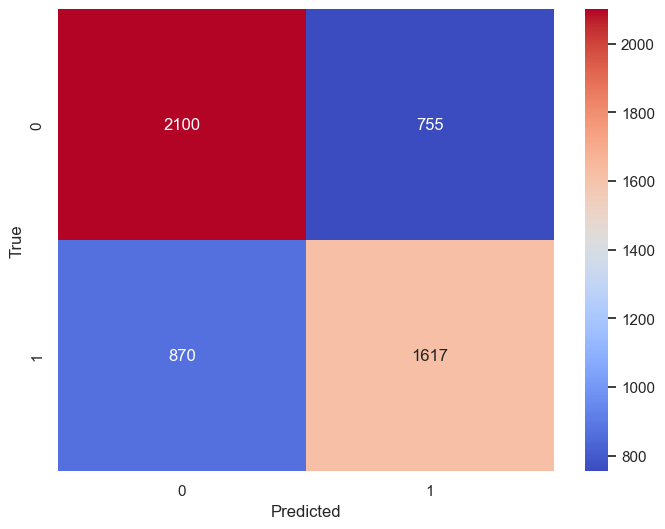

In [35]:
# Calculation of evaluatation metrics to view performance of Decision Tree Classifier Model
evaluate_model(Decision_tree_base_model_1)

The decision tree model, without hyperparameter tuning, exhibits high training accuracy at 97%, indicating an excellent fit to the training data, but suffers from a significant drop in test accuracy to 69.5%. This discrepancy suggests potential overfitting, where the model excels on known data but struggles with unseen data. Cross-validation accuracy confirms this by aligning closely with the test accuracy at 68.6%. The precision, recall, and F1-score metrics highlight a balanced trade-off, with relatively consistent performance for both classes. Further hyperparameter tuning may help improve the base model's generalization and achieve a better balance between training and test performance.

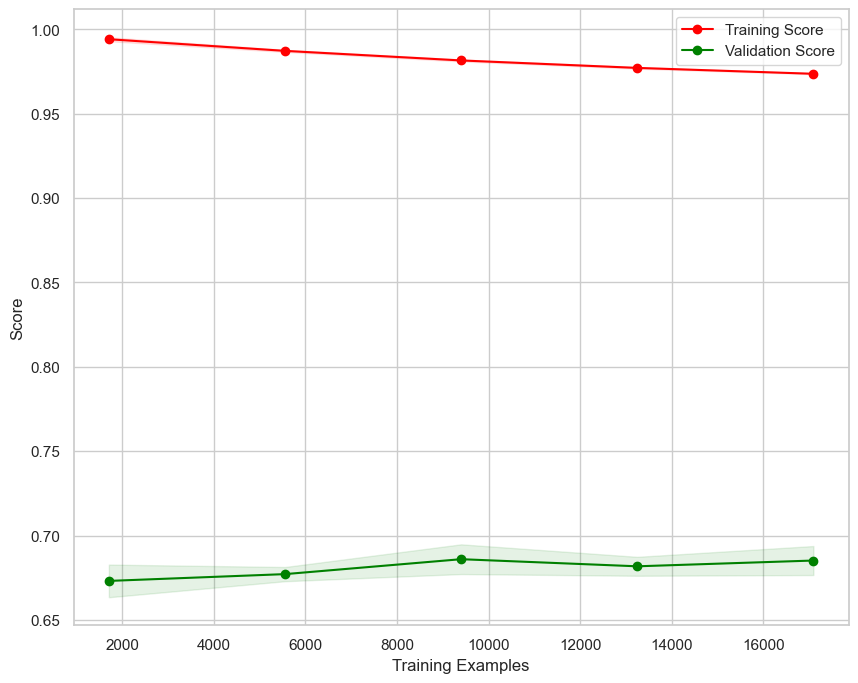

In [36]:
# Plotting learning curve
plot_learning_curve(Decision_tree_base_model_1)

The learning curve indicates a huge variance in model performance, with a pronounced training score outperforming the test score, reflecting overfitting in the decision tree model.

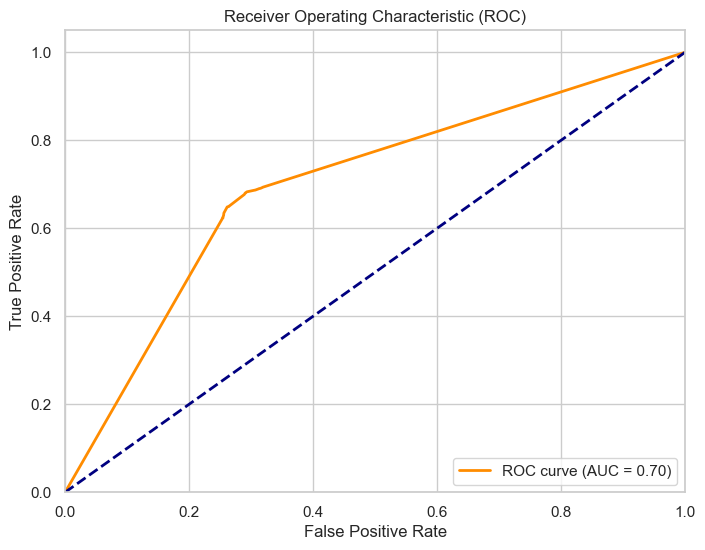

In [37]:
# Plot ROC curve
plot_roc_auc(Decision_tree_base_model_1)

### <span style= 'color: orange'>  Decision Tree Classifier Model with Tuned Hyperparameters </span>

In [38]:
# Create the DecisionTreeClassifier
tree_2 = DecisionTreeClassifier()

# Define the parameter grid with hyperparameters max_depth, min_samples_split, and min_samples_leaf
param_grid = {
    'criterion': ['entropy'],
    'max_depth': [5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5]
}
# Getting the best Decision Tree Parameters for tuning the base model
# Create the GridSearchCV
cv = 10
tuned_base_decision_tree = GridSearchCV(estimator=tree_2, 
                                  param_grid=param_grid,
                                  scoring='accuracy',
                                  cv=cv)

# Fit the model to the scaled training data
Decision_tree_base_model_2 = tuned_base_decision_tree.fit(X_train_scaled, y_train)


In [39]:
# Tuned Parameters
tuned_base_decision_tree.best_params_

{'criterion': 'entropy',
 'max_depth': 10,
 'min_samples_leaf': 1,
 'min_samples_split': 10}

Model Train accuracy: 0.798
Model Test accuracy: 0.760
Cross Validation Accuracy: 75.488%

--------------------------------------------

              precision    recall  f1-score   support

           0       0.76      0.81      0.78      2855
           1       0.76      0.70      0.73      2487

    accuracy                           0.76      5342
   macro avg       0.76      0.76      0.76      5342
weighted avg       0.76      0.76      0.76      5342



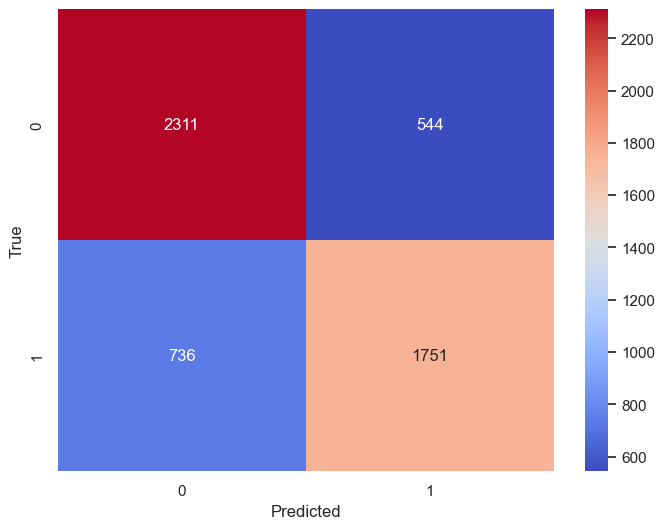

In [40]:
# Calculation of evaluatation metrics to view performance of Decision Tree Classifier Modelwith tuned parameters
evaluate_model(Decision_tree_base_model_2)

With tuned hyperparameters, the decision tree model demonstrates improved balance between training and test performance. The training accuracy, although lower at 79.7%, still reflects a reasonable fit to the training data. Importantly, the test accuracy rises to 76%, a significant improvement over the untuned model. Cross-validation accuracy closely aligns with the test accuracy at 75.5%. Precision, recall, and F1-scores maintain a balanced trade-off, with consistent performance for both classes. The tuned model shows better generalization, with improved accuracy and a more robust overall performance, indicating effective hyperparameter adjustments to address overfitting observed in the untuned model.

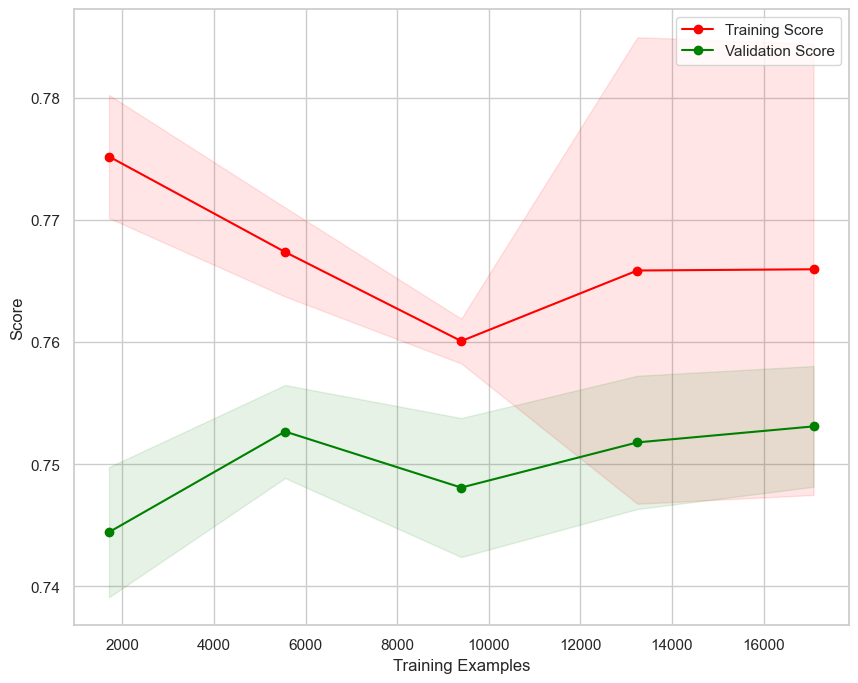

In [41]:
# Plotting Learning curve
plot_learning_curve(Decision_tree_base_model_2)

The training score significantly exceeds the test score, indicative of overfitting still in the tuned decision tree model. However, hyperparameter optimization has reduced the variance.

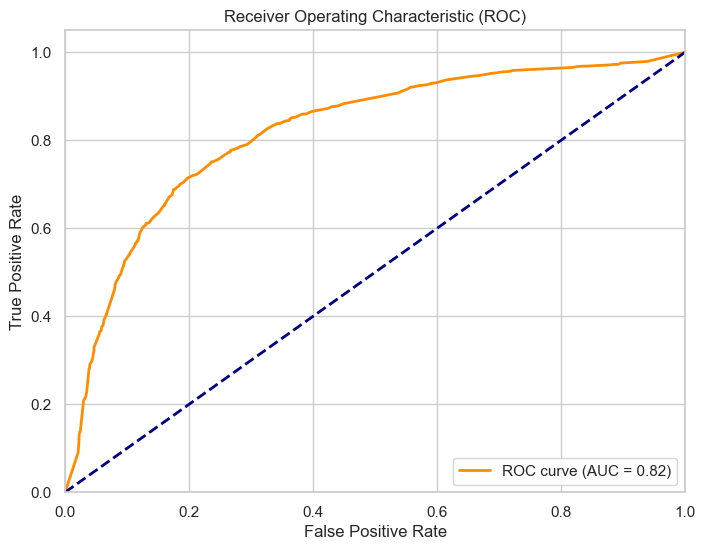

In [42]:
# Plotting ROC curve
plot_roc_auc(Decision_tree_base_model_2)

The ROC curve reveals a significant improvement in model discriminative power, as the AUC increases from 0.70 to 0.82, indicating a stronger ability of predicting between positive and negative cases.

### <span style= 'color: orange'>  Logistic Regression Classifier Model </span>

In [43]:
# Create the LogisticRegression model
logistic_regression_1 = LogisticRegression()

# Fit the model to the scaled training data
logistic_regression_model_1 = logistic_regression_1.fit(X_train_scaled, y_train)

Model Train accuracy: 0.768
Model Test accuracy: 0.765
Cross Validation Accuracy: 76.7096%

--------------------------------------------

              precision    recall  f1-score   support

           0       0.76      0.82      0.79      2855
           1       0.77      0.71      0.74      2487

    accuracy                           0.77      5342
   macro avg       0.77      0.76      0.76      5342
weighted avg       0.77      0.77      0.76      5342



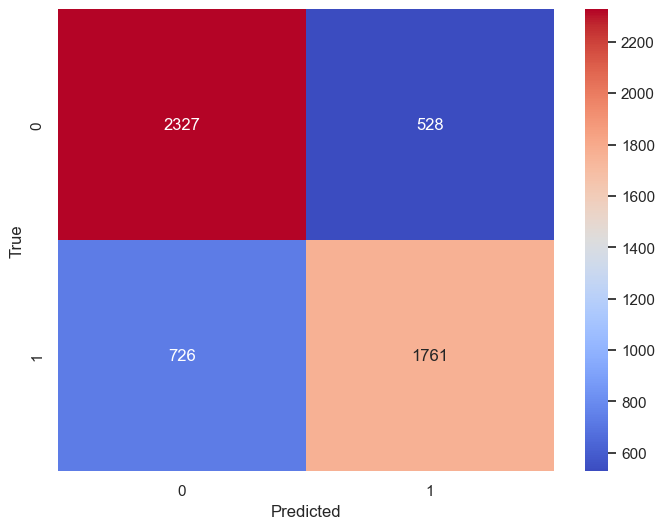

In [44]:
# Calculation of evaluatation metrics to view performance of Logistic Regression Classifier Model
evaluate_model(logistic_regression_model_1)

The untuned logistic regression model exhibits fairly balanced performance. Training accuracy stands at 76.8%, with test accuracy at 76.5%. Cross-validation confirms consistency at 76.7%. Precision and recall are fairly balanced for both classes, resulting in an overall accuracy of 77%.

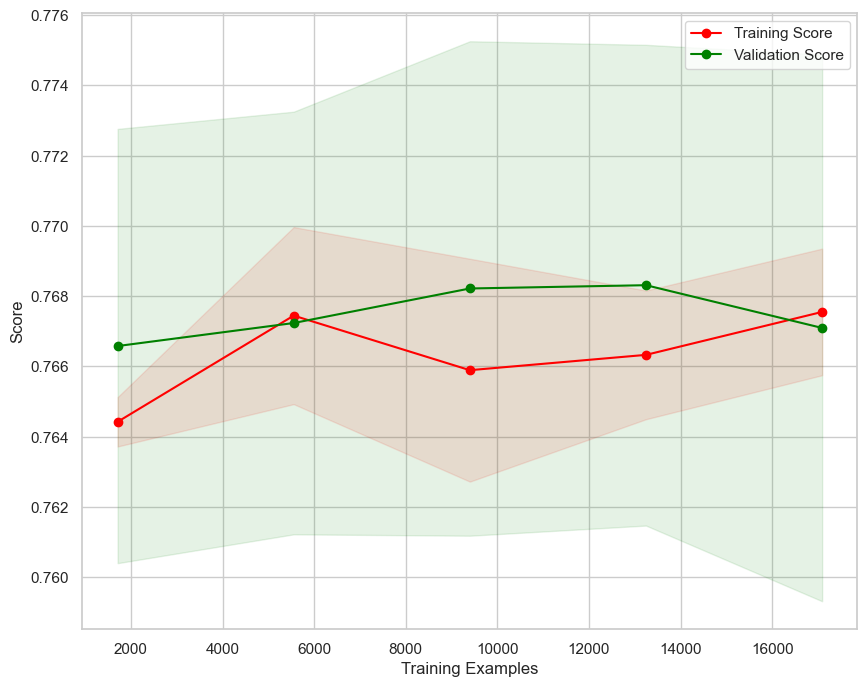

In [45]:
# Plotting Learning curve
plot_learning_curve(logistic_regression_model_1)

The training score is slightly above the validation/testing score in most of the points indicating substantial overfitting.

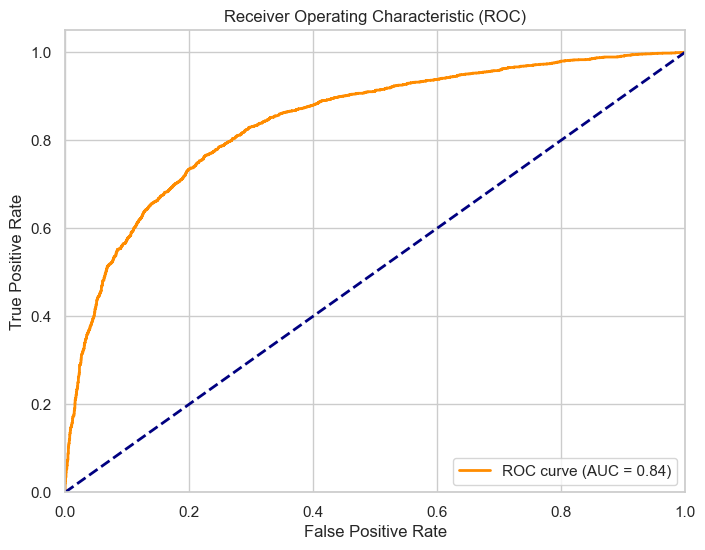

In [46]:
# Plot ROC curve
plot_roc_auc(logistic_regression_model_1)

### <span style= 'color: orange'>  Logistic Regression Classifier Model with Tuned Hyperparameters </span>

In [47]:
# Build the Logistic Regression Classifier Model with Tuned Hyperparameters
logistic_regression_2 = LogisticRegression()

# Getting the best Logistic Regression Parameter for tuning the model
param_grid = [{'penalty': ['l1', 'l2'], 'C': [0.002, 0.02, 0.2, 1, 10]}]

# Create the GridSearchCV
cv = 10
tuned_logistic_regression = GridSearchCV(estimator=logistic_regression_2, 
                                       param_grid=param_grid,
                                       scoring='accuracy',
                                       cv=cv)

# Fit the model to the scaled training data
logistic_regression_model_2 = tuned_logistic_regression.fit(X_train_scaled, y_train)

In [48]:
#  Optimized Hyperparameters
tuned_logistic_regression.best_params_

{'C': 0.2, 'penalty': 'l2'}

Model Train accuracy: 0.767
Model Test accuracy: 0.767
Cross Validation Accuracy: 76.7003%

--------------------------------------------

              precision    recall  f1-score   support

           0       0.76      0.82      0.79      2855
           1       0.77      0.71      0.74      2487

    accuracy                           0.77      5342
   macro avg       0.77      0.76      0.76      5342
weighted avg       0.77      0.77      0.77      5342



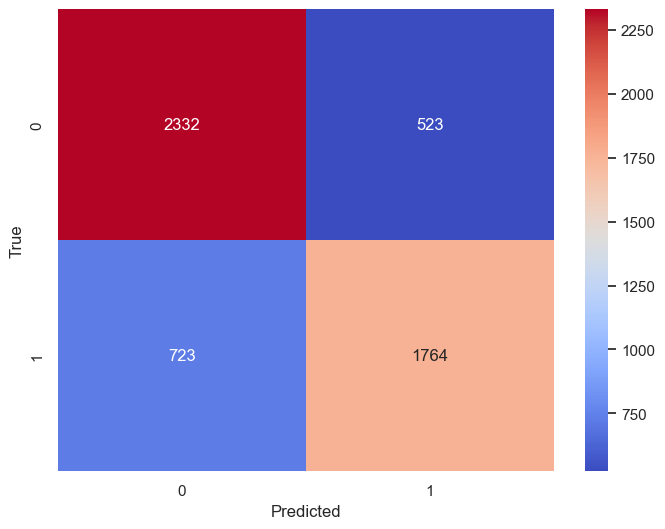

In [49]:
# Calculation of evaluatation metrics to view performance of Logistic Regression Classifier Model with Tuned Hyperparameters
evaluate_model(logistic_regression_model_2)

No much improvement from the logistic regression model without tuned parameters. The logistic regression model with tuned parameters maintains a similar performance to the untuned model. Training and test accuracy remain at 76.7%, with cross-validation accuracy at 76.7%. Precision, recall, and F1-scores show a balanced trade-off, resulting in an overall accuracy of 77%.

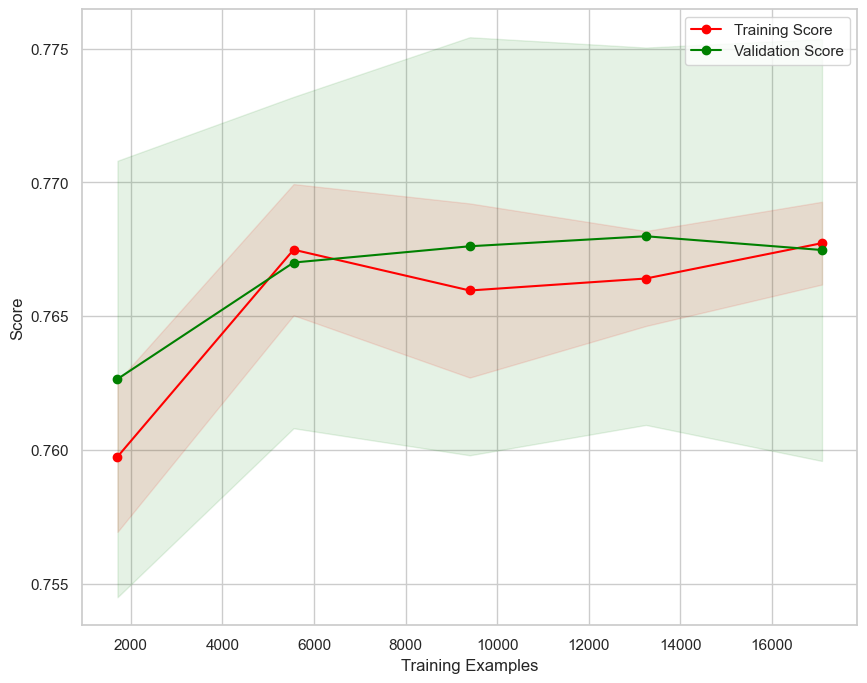

In [50]:
# Plotting Learning curve
plot_learning_curve(logistic_regression_model_2)

Even after optimizing the parameters, even if the variation has reduced, still the training score is slightly above the validation/testing score in most of the points indicating overfitting.

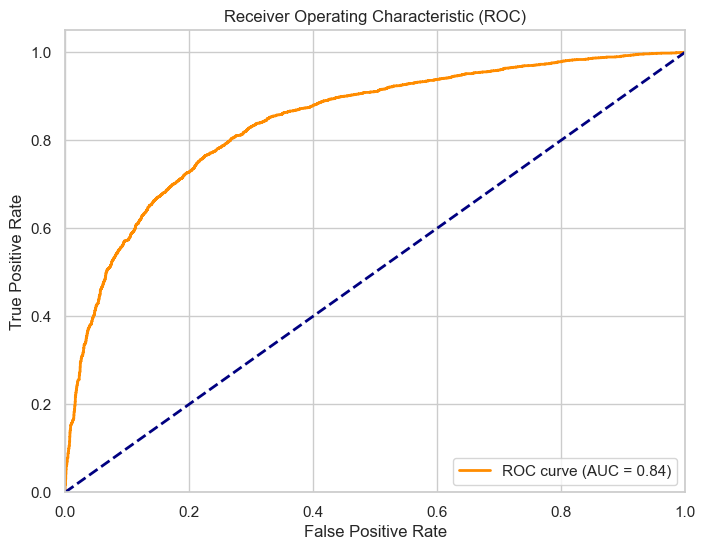

In [51]:
# Plot ROC curve
plot_roc_auc(logistic_regression_model_2)

AUC of 0.84 indicates strong ability of predicting between positive and negative cases.

### <span style= 'color: orange'>  Gradient Boost Classifier </span>

In [52]:
# Create the GradientBoostingClassifier
gb_classifier_1 = GradientBoostingClassifier()

# Fit the model to the scaled training data
gb_classifier_model_1 = gb_classifier_1.fit(X_train_scaled, y_train)

Model Train accuracy: 0.779
Model Test accuracy: 0.778
Cross Validation Accuracy: 77.2292%

--------------------------------------------

              precision    recall  f1-score   support

           0       0.78      0.82      0.80      2855
           1       0.78      0.73      0.75      2487

    accuracy                           0.78      5342
   macro avg       0.78      0.78      0.78      5342
weighted avg       0.78      0.78      0.78      5342



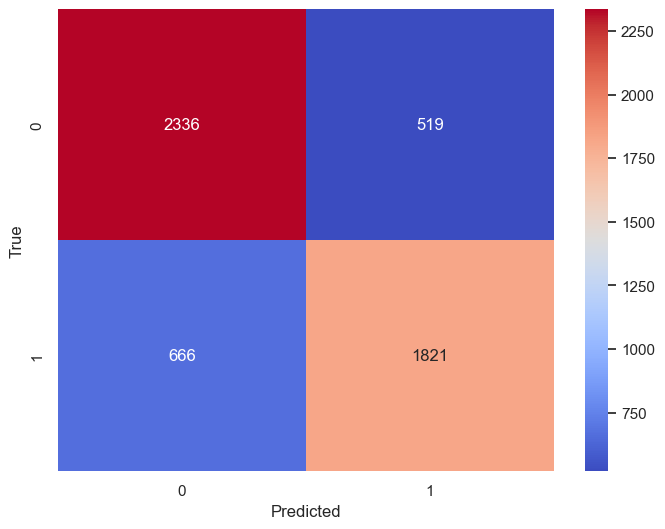

In [53]:
# Calculation of evaluatation metrics to view performance of gradient boost model
evaluate_model(gb_classifier_model_1)

The untuned gradient boosting model exhibits a well-balanced performance. Training accuracy is 77.9%, and test accuracy is 77.8%. Cross-validation accuracy aligns closely with test accuracy at 77.2%, indicating consistent performance. Precision, recall, and F1-scores are well-balanced for both classes, resulting in an overall accuracy of 78%. 

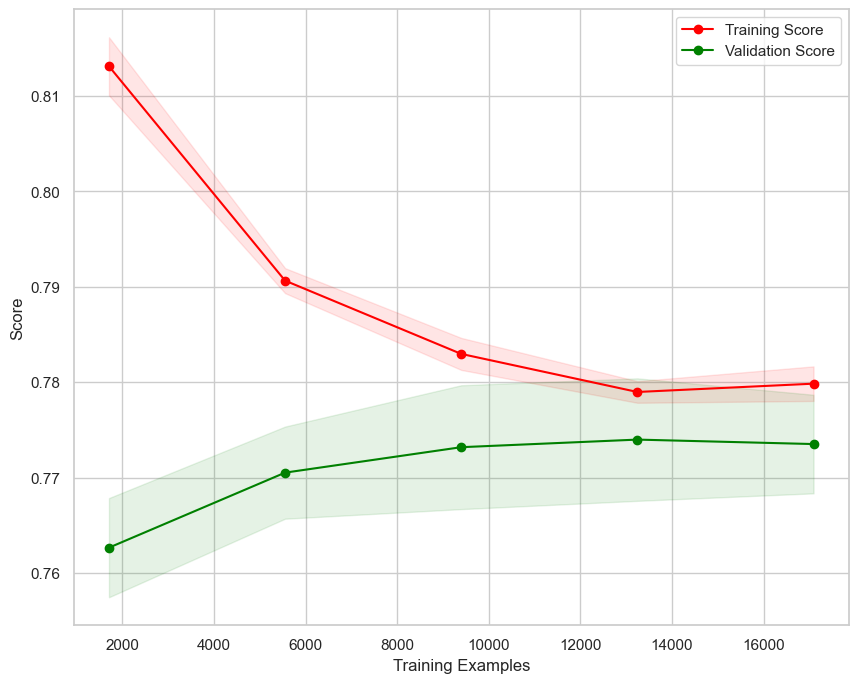

In [54]:
# Plot Learning curve
plot_learning_curve(gb_classifier_model_1)

The learning curve indicates that the model is performing better on the training set than the testing/validation set.

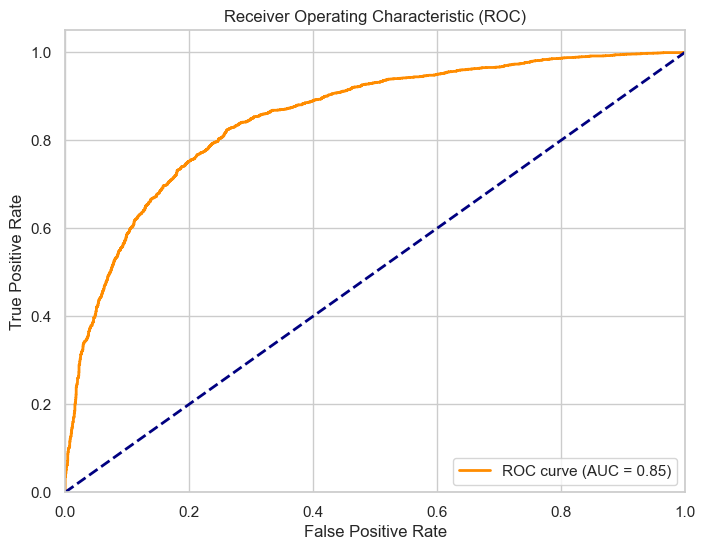

In [55]:
# Plotting ROC curve
plot_roc_auc(gb_classifier_model_1)

AUC of 0.85 indicates strong ability of predicting between positive and negative cases

### <span style= 'color: orange'>  Gradient Boost Classifier With Tuned parameters </span>

In [56]:
# Define the parameter grid for the GradientBoostingClassifier
param_dist = {
    'loss': ['deviance', 'exponential'],
    'learning_rate': [0.1,0.2,0.3,0.4],
    'n_estimators': [40,50,60,70,80,100],
    'min_samples_split': [2,3,4,5,6,7,8,9,10],
    'min_samples_leaf': [2,3,4,5,6,7,8,9,10]
}

# Create the GradientBoostingClassifier
gb_classifier_2 = GradientBoostingClassifier()

# Create the RandomizedSearchCV
n_iter = 10  # Adjust the number of iterations as needed
cv = 5
gb_random_search = RandomizedSearchCV(estimator=gb_classifier_2,
                                      param_distributions=param_dist,
                                      n_iter=n_iter,
                                      scoring='accuracy',
                                      cv=cv,
                                      verbose=False)

# Fit the model to the scaled training data
gb_classifier_model_2 = gb_random_search.fit(X_train_scaled, y_train)


In [57]:
# Optimized Hyparameters
gb_random_search.best_params_

{'n_estimators': 60,
 'min_samples_split': 7,
 'min_samples_leaf': 2,
 'loss': 'exponential',
 'learning_rate': 0.4}

Model Train accuracy: 0.783
Model Test accuracy: 0.775
Cross Validation Accuracy: 77.2712%

--------------------------------------------

              precision    recall  f1-score   support

           0       0.78      0.81      0.79      2855
           1       0.77      0.74      0.75      2487

    accuracy                           0.77      5342
   macro avg       0.77      0.77      0.77      5342
weighted avg       0.77      0.77      0.77      5342



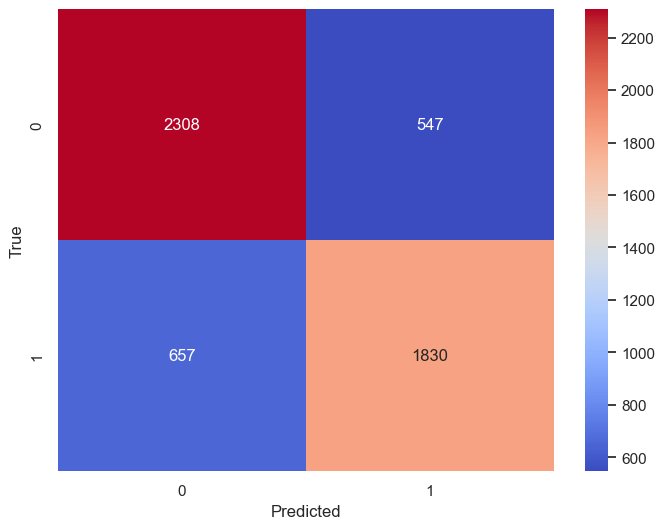

In [58]:
# Calculation of evaluatation metrics to view performance of gradient boost model with tuned parameters
evaluate_model(gb_classifier_model_2)

The gradient boosting model with optimized parameters shows incremental improvement compared to the untuned model. Training accuracy increases slightly to 78.1%, and test accuracy remains high at 77.5%. Cross-validation accuracy also improves to 77.3%, indicating consistency. The tuned model reflects better generalization and a slightly enhanced balance between training and test performance compared to gradient boosting model with no tuned parameters.

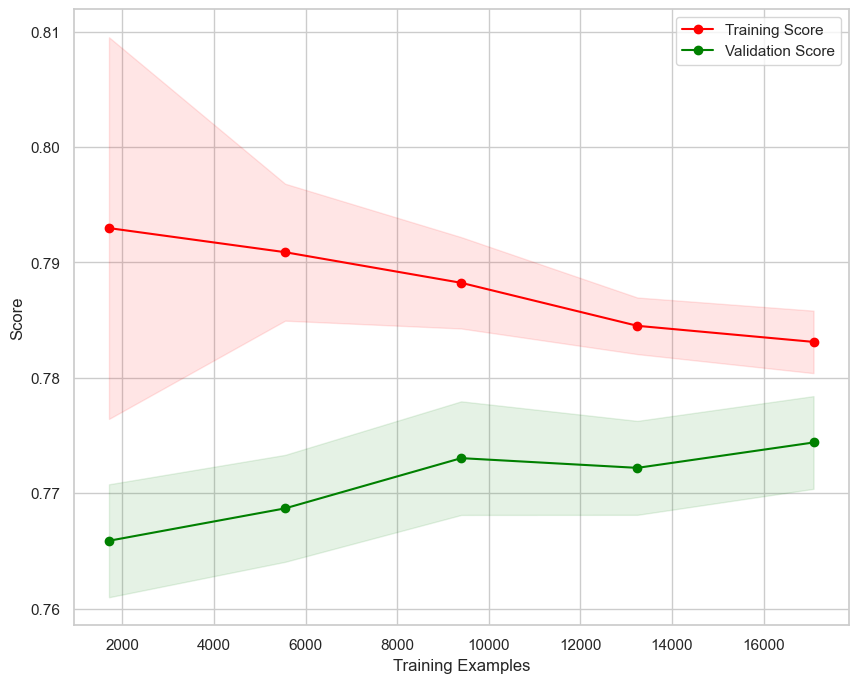

In [59]:
# Plot learning curve
plot_learning_curve(gb_classifier_model_2)

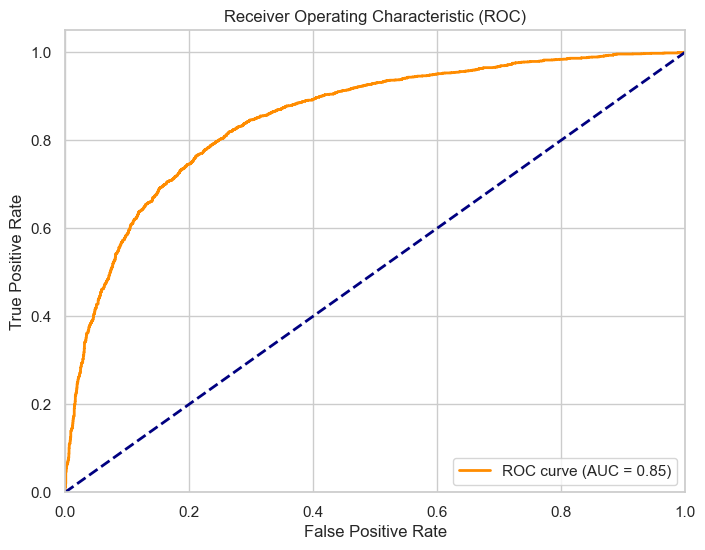

In [60]:
# Plotting ROC curve
plot_roc_auc(gb_classifier_model_2)

No change observed on the predicting ability based on ROC curve from the un-optimized gradient boosting algorithm above.

### <span style= 'color: orange'>  XGBoost Classifier </span>

In [61]:
# Create the GradientBoostingClassifier
xg_classifier_1 = XGBClassifier()

# Fit the model to the scaled training data
xg_classifier_model_1 = xg_classifier_1.fit(X_train_scaled, y_train)

Model Train accuracy: 0.842
Model Test accuracy: 0.770
Cross Validation Accuracy: 76.4194%

--------------------------------------------

              precision    recall  f1-score   support

           0       0.78      0.80      0.79      2855
           1       0.76      0.74      0.75      2487

    accuracy                           0.77      5342
   macro avg       0.77      0.77      0.77      5342
weighted avg       0.77      0.77      0.77      5342



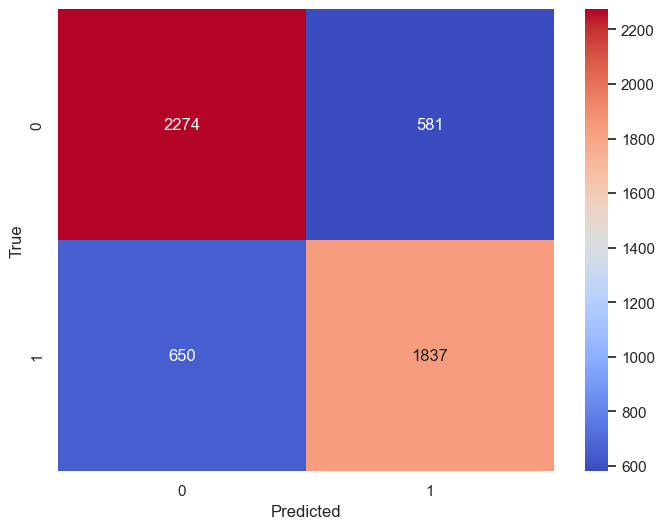

In [62]:
# Calculation of evaluatation metrics to view performance of XG boost model
evaluate_model(xg_classifier_model_1)

The XGBoost model demonstrates strong predictive power with high training accuracy at 84.2%. However, the test accuracy is slightly lower at 77%, suggesting a potential issue of overfitting. Cross-validation accuracy aligns closely with the test accuracy at 76.5%. Precision, recall, and F1-scores are well-balanced for both classes, resulting in an overall accuracy of 77%. Hyperparameter optimization is needed to enhance generalization and reduce overfitting, ensuring consistent performance on unseen data.

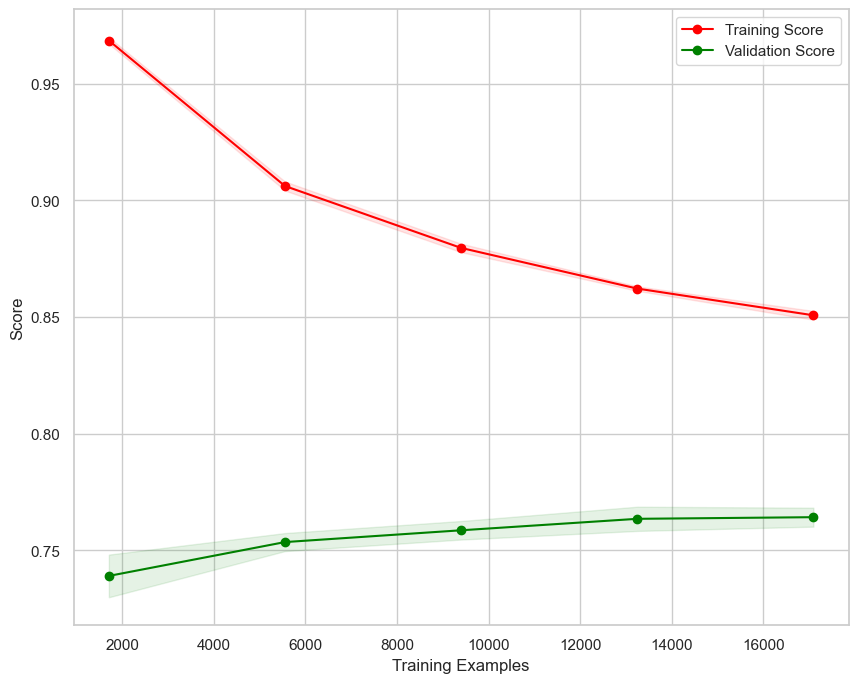

In [63]:
# Plot learning curve
plot_learning_curve(xg_classifier_model_1)

The training and validation learning curves visualizes overfitting in the XG Boosting model with no optimized parameters.

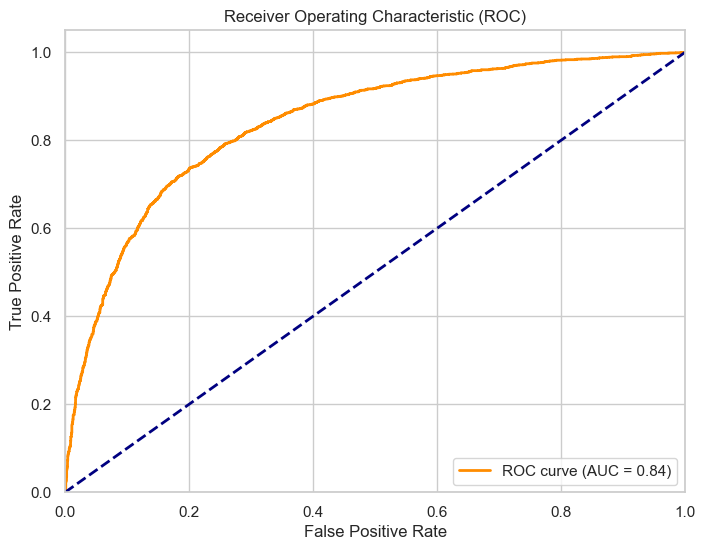

In [64]:
# Plot ROC curve
plot_roc_auc(xg_classifier_model_1)

Though the XG Boosting model has overfitting issues, it has high ability (84%) of classifying correctly individuals likely to be vaccinated with seasonal vaccine and those unlikely.

### <span style= 'color: orange'>  XGBoost Classifier with Tuned Parameters </span>

In [65]:
# Getting the best XGBoost Parameters for tuning the model
# Define the parameter grid for the XGBClassifier
param_grid = {
    'eta': [0.1, 0.2, 0.3],
    'gamma': [49, 50],
    'max_depth': [5],
    'subsample': [0.1, 0.2, 0.3],
    'booster': ['gbtree'],
    'learning_rate': [0.1, 0.2]
}

# Create the XGBClassifier
xg_classifier_2 = XGBClassifier()

# Create the GridSearchCV
cv = 5
xg_grid_search = GridSearchCV(estimator=xg_classifier_2,
                               param_grid=param_grid,
                               scoring='accuracy',
                               cv=cv,
                               verbose=False)

# Fit the model to the scaled training data
xg_classifier_model_2 = xg_grid_search.fit(X_train_scaled, y_train)


In [66]:
# Best hyperparameters
xg_grid_search.best_params_

{'booster': 'gbtree',
 'eta': 0.1,
 'gamma': 49,
 'learning_rate': 0.2,
 'max_depth': 5,
 'subsample': 0.3}

Model Train accuracy: 0.769
Model Test accuracy: 0.770
Cross Validation Accuracy: 76.41%

--------------------------------------------

              precision    recall  f1-score   support

           0       0.77      0.81      0.79      2855
           1       0.77      0.72      0.75      2487

    accuracy                           0.77      5342
   macro avg       0.77      0.77      0.77      5342
weighted avg       0.77      0.77      0.77      5342



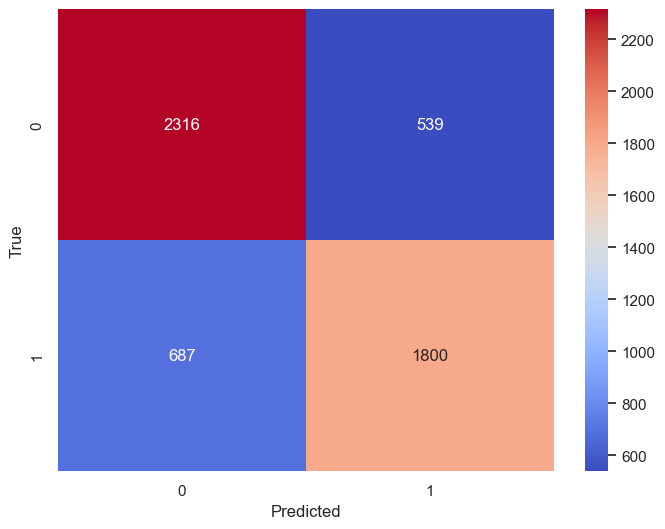

In [67]:
# C# Calculation of evaluatation metrics to view performance of XG Boost model with optimized parameters
evaluate_model(xg_classifier_model_2)

The XGBoost model with optimized parameters maintains strong performance. Training accuracy is slightly lower at 76.9%, while test accuracy remains the same at 77%. Cross-validation accuracy is also consistent at 76.41%. Precision, recall, and F1-scores maintain a balanced trade-off, resulting in an overall accuracy of 77%. The tuned model reflects stable generalization with balanced performance, demonstrating that hyperparameter optimization has preserved model effectiveness.

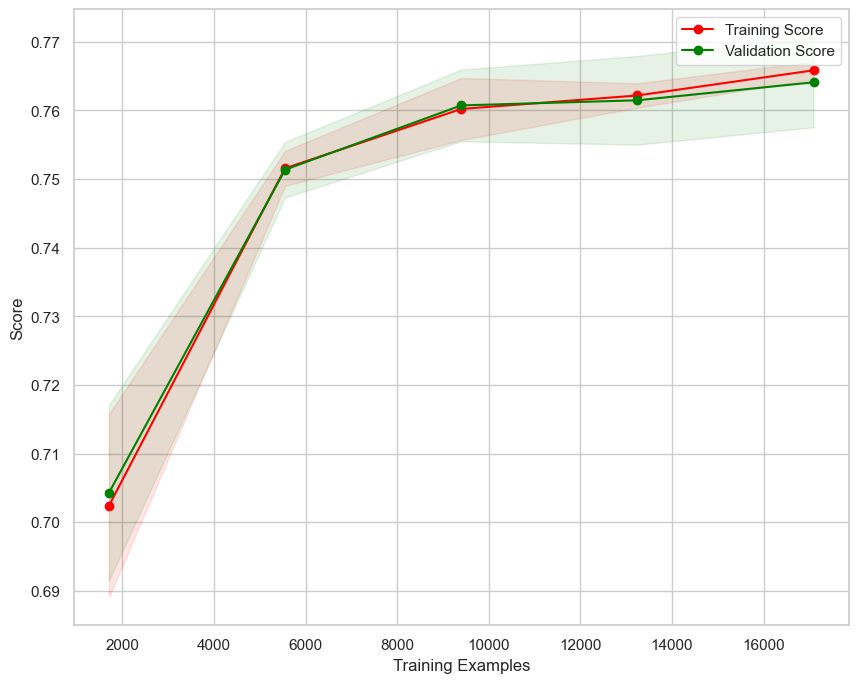

In [68]:
# Plotting learning curve 
plot_learning_curve(xg_classifier_model_2)

The learning curves shows high consistency in the both training and validation/testing scores indicating no overfitting or underfitting.

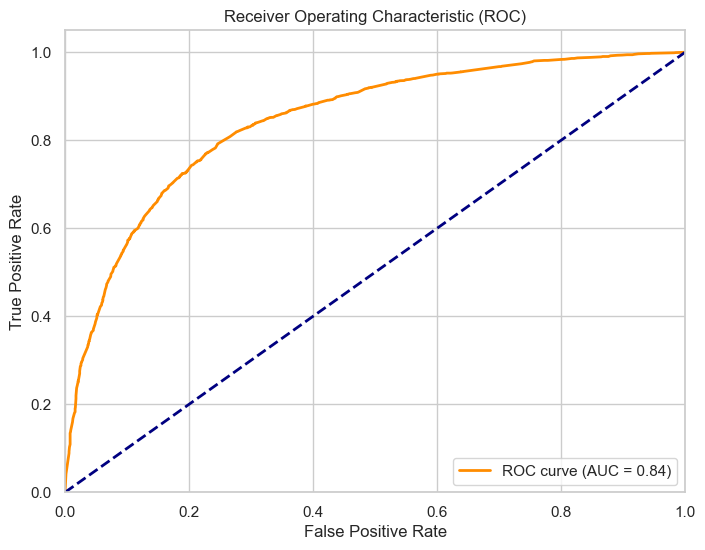

In [69]:
# Plot ROC curve
plot_roc_auc(xg_classifier_model_2)

Despite tuning the model parameters, stillthe model maintains 84% ability of prediction.

### <span style= 'color: orange'>  Random Forest </span>

In [70]:
# Create the RandomForestClassifier
rf_classifier_1 = RandomForestClassifier()

# Fit the model to the scaled training data
rf_classifier_model_1 = rf_classifier_1.fit(X_train_scaled, y_train)

Model Train accuracy: 0.970
Model Test accuracy: 0.755
Cross Validation Accuracy: 74.8701%

--------------------------------------------

              precision    recall  f1-score   support

           0       0.76      0.80      0.78      2855
           1       0.75      0.71      0.73      2487

    accuracy                           0.75      5342
   macro avg       0.75      0.75      0.75      5342
weighted avg       0.75      0.75      0.75      5342



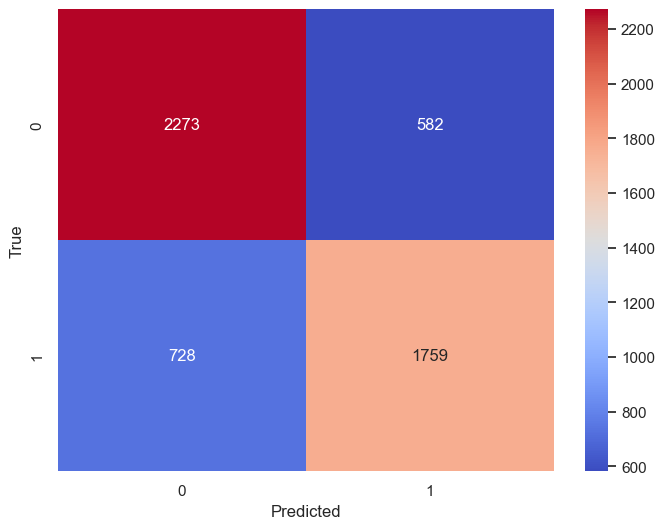

In [71]:
# Calculation of evaluatation metrics to view performance of Random forest model.
evaluate_model(rf_classifier_model_1)

The random forest classifier model displays an issue of overfitting, indicated by the high training accuracy at 97%. However, this leads to a drop in test accuracy to 75%, suggesting a lack of generalization. Cross-validation accuracy aligns with the test accuracy at 75.02%. Precision, recall, and F1-scores are balanced for both classes, resulting in an overall accuracy of 75%. Addressing overfitting through hyperparameter tuning or reducing model complexity may improve generalization and test performance.

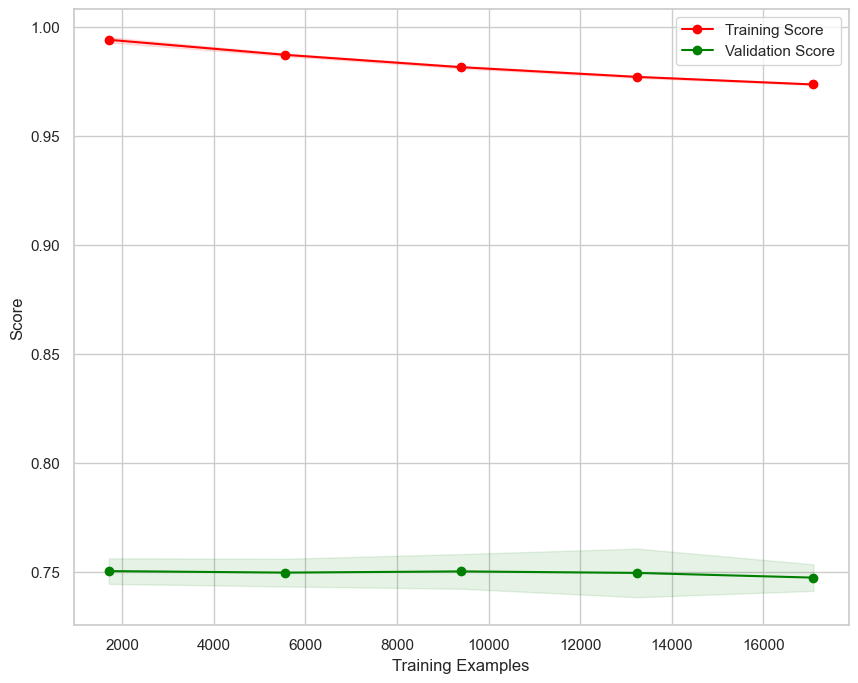

In [72]:
# Plot Learnig curve 
plot_learning_curve(rf_classifier_model_1)

The learning curve scores training and validation tests have a relatively huge variation. This shows classification model overfitting.  

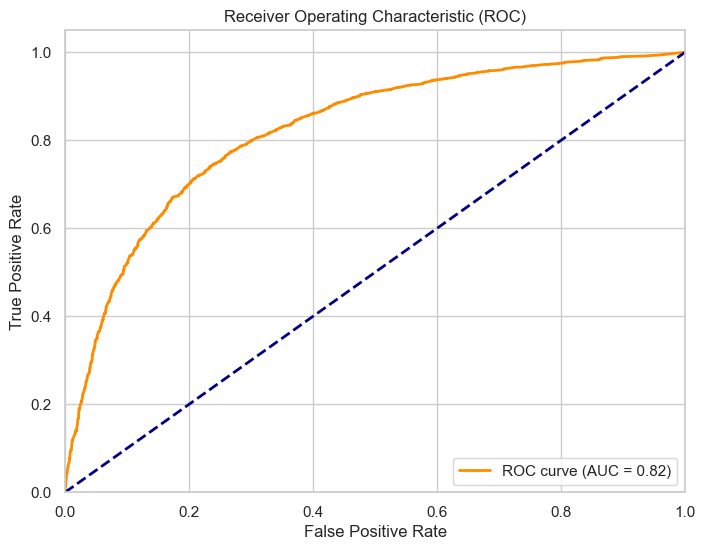

In [73]:
# Plotting ROC curve
plot_roc_auc(rf_classifier_model_1)

This model classifier has 82% likelihood of correctly classifying.

### <span style= 'color: orange'>  Random Forest With Tuned Parameters </span>

In [74]:
# Define the parameter grid for the RandomForestClassifier with a range of values
param_grid = {
    'n_estimators': [87, 88, 89, 90, 91, 92, 93, 100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [5],
    'min_samples_split': range(5, 10),
    'min_samples_leaf': range(5, 10),
}

# Create the RandomForestClassifier
rf_classifier_2 = RandomForestClassifier()

# Create the RandomizedSearchCV
cv = 5
n_iter = 10  # You can adjust the number of iterations
rf_random_search = RandomizedSearchCV(
    estimator=rf_classifier_2, 
    param_distributions=param_grid,  # Use param_distributions instead of param_grid
    n_iter=n_iter,  # Specify the number of random combinations to try
    scoring='accuracy',
    cv=cv
)

# Fit the model to the scaled training data
rf_classifier_model_2 = rf_random_search.fit(X_train_scaled, y_train)


In [75]:
# Optimal hyperparameters for Random Forest algorithm
rf_random_search.best_params_

{'n_estimators': 100,
 'min_samples_split': 6,
 'min_samples_leaf': 8,
 'max_depth': 5,
 'criterion': 'gini'}

Model Train accuracy: 0.768
Model Test accuracy: 0.765
Cross Validation Accuracy: 76.4428%

--------------------------------------------

              precision    recall  f1-score   support

           0       0.76      0.82      0.79      2855
           1       0.78      0.70      0.73      2487

    accuracy                           0.76      5342
   macro avg       0.77      0.76      0.76      5342
weighted avg       0.77      0.76      0.76      5342



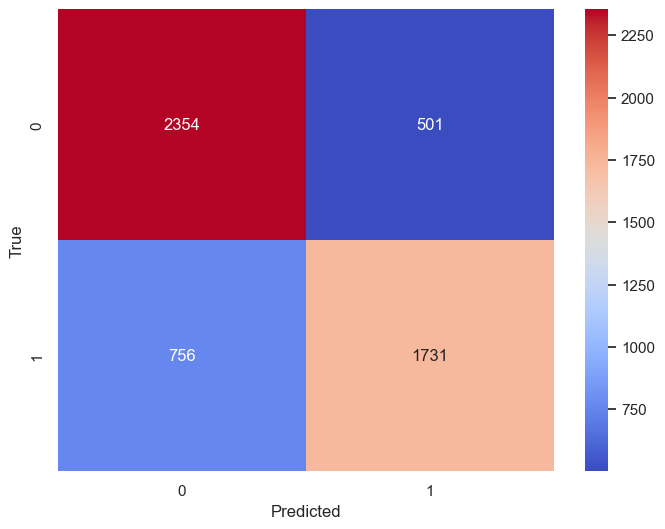

In [76]:
# Calculation of evaluatation metrics to view performance of Random Forest model with tuned parameters
evaluate_model(rf_classifier_model_2)

The random forest model with tuned parameters shows a marked improvement compared to the random forest model above with no pruned parameters. The training accuracy decreases slightly to 76.9%, but the test accuracy remains at 76.5%. Cross-validation accuracy is also consistent at 76.56%. Precision, recall, and F1-scores maintain a balanced trade-off for both classes, resulting in an overall accuracy of 77%. The tuned model exhibits better generalization and addresses the overfitting. 

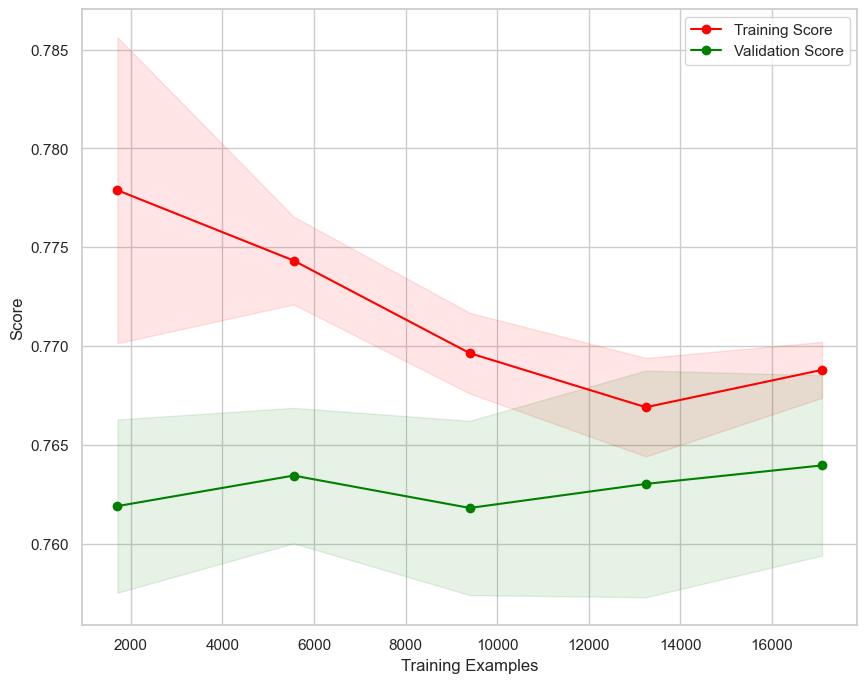

In [77]:
plot_learning_curve(rf_classifier_model_2)

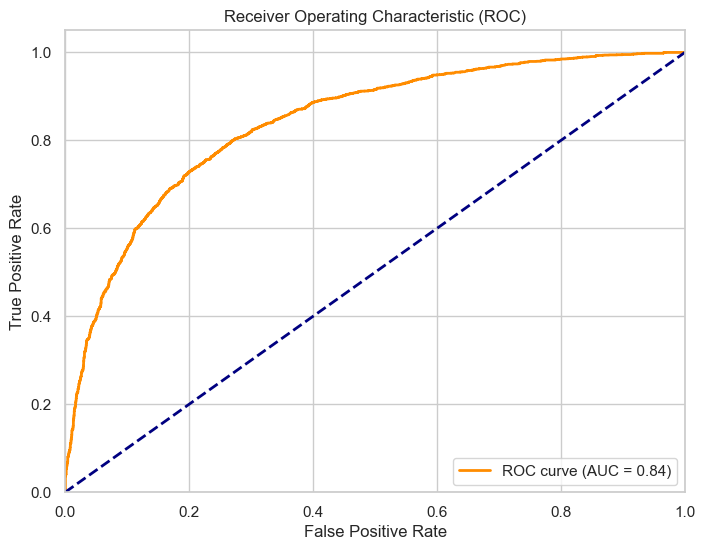

In [78]:
# Plot ROC curve
plot_roc_auc(rf_classifier_model_2)

## <span style= 'color : green'>  Evaluation </span>

Since majority of the above trained machine learning models exhibits robust balance on the bias trade off in precision, recall, F1 score, they will be evaluated on the following bases:
1. Prediction accuracy on the training and testing/validation sets
2. Area under the curve using Receiver Operating Characteristic (ROC) curves.
3. Consistency in prediction accuracy of both training and validation sets to avoid underfitting/overfitting.

The following dataframes represent comprehensive results for each model's performance evaluation.

In [79]:
# Modelling results' scores
modelling_scores = {
    'Model': ['Decision_tree', 'Optimized_Decision_tree', 'Logistic_Regression', 'Optimized_Logistic_Regression',
              'Gradient_boosting', 'Optimized_Gradient_boosting', 'XGBoost', 'Optimized_XGBoost',
              'Random_Forest', 'Optimized_Random_Forest'],
    'Model_Train_Accuracy': [97.0, 79.7, 76.8, 76.7, 77.9, 78.1, 84.2, 76.9, 97.0, 76.9],
    'Model_Test_Accuracy': [69.5, 76.0, 76.5, 76.7, 77.8, 77.5, 77.0, 77.0, 75.0, 76.5],
    'Cross_Validation_Accuracy': [68.589, 75.488, 76.710, 76.700, 77.229, 77.327, 76.546, 76.410, 75.020, 76.560],
    'Area_Under_the_Curve': [70, 82, 84, 84, 85, 85, 84, 84, 82, 84]
}

# Create a DataFrame from the modelling_scores
scores_df = pd.DataFrame(modelling_scores)

scores_df

,Model,Model_Train_Accuracy,Model_Test_Accuracy,Cross_Validation_Accuracy,Area_Under_the_Curve
0,Decision_tree,97.0,69.5,68.589,70
1,Optimized_Decision_tree,79.7,76.0,75.488,82
2,Logistic_Regression,76.8,76.5,76.710,84
3,Optimized_Logistic_Regression,76.7,76.7,76.700,84
4,Gradient_boosting,77.9,77.8,77.229,85
5,Optimized_Gradient_boosting,78.1,77.5,77.327,85
6,XGBoost,84.2,77.0,76.546,84
7,Optimized_XGBoost,76.9,77.0,76.410,84
8,Random_Forest,97.0,75.0,75.020,82
9,Optimized_Random_Forest,76.9,76.5,76.560,84


###### Visualize the scores_df using a bar graph

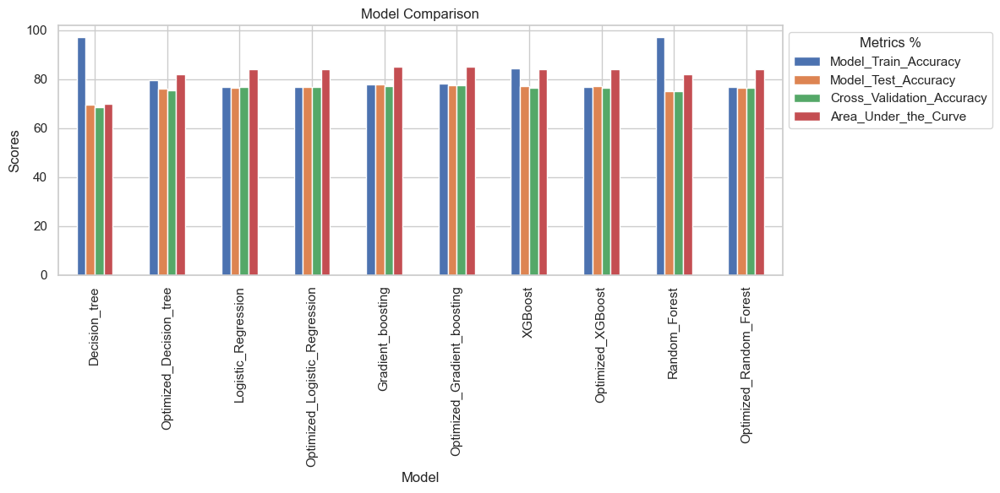

In [80]:
# Set the "Model" column as the index for better visualization
scores_df.set_index('Model', inplace=True)

# Plot the bar chart
scores_df.plot(kind='bar', figsize=(12, 6))
plt.title('Model Comparison')
plt.xlabel('Model')
plt.ylabel('Scores')
legend = plt.legend(title='Metrics %', loc='upper left', bbox_to_anchor=(1, 1))
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()
# Save the plot as an image file
plt.savefig('bar_graph_models_results.png', bbox_inches='tight')
# Show the chart
plt.show();

###### Visualize the scores_df using a Heatmap

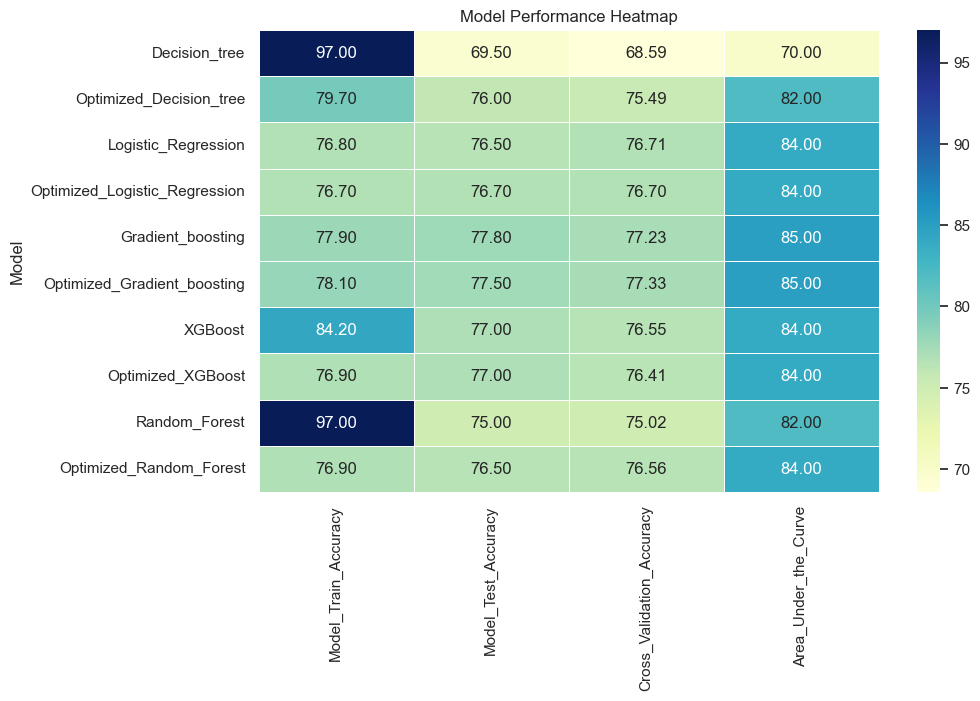

In [81]:
# Create the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(scores_df, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=0.5)
plt.title('Model Performance Heatmap')
plt.savefig('Heatmap_models_results.png', bbox_inches='tight')
plt.show()

Starting with the Decision Tree model, it initially shows high training accuracy but struggles with overfitting, resulting in lower generalization on the test and cross-validation datasets. The Optimized Decision Tree improves but doesn't outperform other models due to its lower AUC.

Logistic Regression exhibits balanced performance, yet it isn't the best model. Its optimized version maintains reliability in flu vaccine likelihood prediction but doesn't outshine other models.

The Random Forest model excels in training accuracy but faces overfitting, resulting in a drop in test and cross-validation performance. Its optimized counterpart offers balance but doesn't outperform others.

XGBoost performs well in identifying flu vaccine likelihood but exhibits a minor test accuracy drop. The Optimized XGBoost maintains reliability in predictions but doesn't stand out.

Gradient Boosting showcases notable accuracy and predictive power. Its optimized version further enhances performance. However, it isn't the best model, as a superior option is available.

In the end, the Optimized Gradient Boosting model emerges as the best choice, offering high accuracy, robust generalization, and strong flu vaccine likelihood predictions, making it the top candidate among the models.

## <span style= 'color : green'>  Conclusion </span>

***Understanding Factors Influencing Flu Vaccine Choices:***
The analysis has provided valuable insights into the factors that influence individuals' choices to receive the annual flu vaccine. Although the dataset used offers intriguing insights, it exhibits noticeable bias towards specific communities, socioeconimic classes and demographic groups. 

***Targeting Specific Population Segments:***
The analysis offers an opportunity to develop targeted strategies for improving vaccination rates. By identifying variables with higher statistical significance, such as age categories, gender, individual's opinions, concerns and knowledge about the vaccines,  the government health agencies can tailor vaccination campaigns to address the unique needs and preferences of different population segments.

***Exploring Statistical Significance:***
The analysis explores the statistical significance of variables, including age_group, opinion_seas_risk, employment_industry, doctor_recc_seasonal, opinion_seas_vacc_effective, opinion_h1n1_risk, doctor_recc_h1n1, chronic_med_condition, household_children, health_worker, h1n1_concern, opinion_h1n1_vacc_effective, rent_or_own, behavioral_touch_face, h1n1_knowledge. It highlights the importance of these variables in predicting vaccination decisions and can guide further investigations or interventions.

***Constructing Predictive Models:***
The project has successfully constructed predictive models to assess whether people are likely to opt for the seasonal flu vaccine under specific conditions or features. Optimized models like Gradient Boosting and XGBoost have shown promise in predicting vaccine choices based on various attributes. However, tuned Gradient Boosting outperforms XGBoost with optimized parameters in terms of performance.

In summary, the analysis has not only achieved its objectives but also paved the way for evidence-based strategies to government public agencies to enhance flu vaccination rates and tailor interventions to specific population segments.


#### <span style= 'color: purple'>  Limitations </span>
1. The dataset used in the analysis was biased and not representative of a wide demographic. This may lead to poor generalization of the predictive model.
2. The model performance left out the time metric required to train various models and therefore training time of each model was not evaluated.
3. Some population segments have lower vaccination rates due to a lack of awareness about the benefits of the Seasonal Flu Vaccine. This affects model generalization.

## <span style= 'color : green'>  Recommendations </span>

1. Diverse Data Collection: To mitigate bias, collect data that more accurately represents a wider demographic and geographic range. Ensure data collection from a more diverse set of communities and population groups
2. Awareness Campaigns: Develop targeted awareness campaigns to educate people about the benefits of the Seasonal Flu Vaccine, particularly focusing on population segments with lower vaccination rates.
3. Improve Data Balance: Work on improving the balance of the dataset to ensure that models generalize well to a broader population. Techniques like oversampling or gathering more data from underrepresented groups may help.
4. Continual Monitoring: Maintain continuous monitoring of vaccination rates and effectiveness. This will help adapt strategies in real-time and ensure the most relevant actions are taken and change the opinions of vaccine risks and illness perception among some individuals.
5. Model Refinement: To improve predictive models, it is essential to focus on optimizing techniques, particularly for the Gradient Boosting model. Further fine-tuning its parameters has the potential to enhance its performance. Additionally, a thorough evaluation of the time required to train various models is crucial to ensure efficiency and streamline the modeling process.